# **Airbnb - Rio de Janeiro**

*24 de maio, 2021*

## **1. Descrição geral do problema**

---

![Airbnb](https://marcas-logos.net/wp-content/uploads/2020/03/Airbnb-logo.png)

Airbnb é um serviço online comunitário para as pessoas anunciarem, descobrirem e reservarem acomodações e meios de hospedagem.

Este sistema permite aos indivíduos alugar o todo ou parte de sua própria casa, como uma forma de acomodação extra. O site fornece uma plataforma de busca e reservas entre a pessoa que oferece a acomodação e o turista que busca pela locação. Abrange mais de 500 mil anúncios em mais de 35.000 cidades e 192 países. Desde sua criação em Novembro de 2008 até Junho de 2012, mais de 10 milhões de reservas foram agendadas via Airbnb.

Os dados por trás do site Inside Airbnb são obtidos de informações publicamente disponíveis no site do Airbnb. Os dados foram analisados, limpos e agregados para facilitar a discussão pública. E nesta análise, este assunto será o tema principal.


**Objetivo:** Utilizar a linguagem **Python**, para **prever o tipo de acomodação escolhido pelos clientes**.

---

## **2. Carregando Dados**

### **2.1 Importando bibliotecas necessárias**

Começaremos nosso projeto, instalando e importanto todas as bilbiotecas necessárias, para a realização das fases iniciais de exploração, e transformação dos dados (*Data Munging*).

In [1]:
# Instalando bibliotecas necessárias para a análise.

!pip3 install phik association_metrics as am

# Instalando pacote wget (no ambiente anaconda).

#!conda install -c menpo wget -y

You should consider upgrading via the 'c:\programdata\anaconda3\envs\r\python.exe -m pip install --upgrade pip' command.


Solving environment: ...working... done

# All requested packages already installed.





==> WARNING: A newer version of conda exists. <==
  current version: 4.9.2
  latest version: 4.10.1

Please update conda by running

    $ conda update -n base -c defaults conda




In [1]:
# Importando biblioteca, para ocultar Future Warnings.

import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.simplefilter(action = 'ignore', category = FutureWarning)
warnings.simplefilter(action = 'ignore', category = ConvergenceWarning)
warnings.simplefilter(action = 'ignore', category = UserWarning)

# Importando biblioteca para manipular funcionalidades do sistema operacional.

import os

# Importando bibliotecas, para a manipulação e exploração dos conjuntos de dados.

import numpy as np

import pandas as pd

# Importando bibliotecas, para tarefas de Data Munging.

from sklearn.feature_selection import VarianceThreshold

# Importando bibliotecas, para a plotagem de gráficos interativos com o plotly.

import plotly.offline as py

import plotly.graph_objs as go

import plotly.figure_factory as ff

py.init_notebook_mode(connected = False)

# Importando bibliotecas, para a plotagem de gráficos com o Seaborn e Matplotlib.

import seaborn as sns

import matplotlib.pyplot as plt

# Importando classes e bibliotecas, para a etapa de pré-processamento dos dados.

from sklearn import preprocessing

from sklearn.preprocessing import MinMaxScaler, PowerTransformer, normalize, LabelEncoder, StandardScaler

# Importando classes para calcular algumas estatísticas.

from scipy.stats import kurtosis, skew

# Importando biliotecas, para a fase de Feature Selection.

from sklearn.decomposition import PCA

from mlxtend.feature_selection import SequentialFeatureSelector as SFS

from sklearn.feature_selection import SelectKBest, SelectPercentile, mutual_info_classif, f_classif, RFE, chi2

# Importando bibliotecas, para a etapa de modelagem preditiva.

import xgboost as xgb

from sklearn import tree

from sklearn.svm import SVC

from sklearn.naive_bayes import GaussianNB

from sklearn.tree import DecisionTreeClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.linear_model import LogisticRegression, RidgeClassifierCV

from sklearn.model_selection import KFold, cross_val_score, train_test_split

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier

# Importando Classe, para carregar e salvar modelos preditivos em arquivos externos.

import pickle

# Importando Classe, para fazer a busca dos melhores parâmetros, a serem utilizados em cada um dos modelos treinados.

from sklearn.model_selection import GridSearchCV

# Importando Classes, para calcular as métricas de avaliação dos modelos preditivos.

from sklearn.metrics import accuracy_score, log_loss

### **2.2 Carregando Dados**

In [2]:
# Criando um dicionário para armazenar o nome das pastas necessárias para a análise.

FOLDERS = {
    'dir'   : 'content',
    'input' : 'inputs',
    'output': 'outputs'
}

# Definindo a hierarquia entre as pastas.

PATHS = {
    'dir'   : FOLDERS['dir'],
    'input' : '/'.join([FOLDERS['dir'], FOLDERS['input']]),
    'output': '/'.join([FOLDERS['dir'], FOLDERS['output']])
}

# Criando a pasta raíz caso não exista.

if not os.path.exists(PATHS['dir']):
    os.mkdir(PATHS['dir'])

# Criando a pasta de input caso não exista.

if not os.path.exists(PATHS['input']):
    os.mkdir(PATHS['input'])

# Criando a pasta de ouputs caso não exista.

if not os.path.exists(PATHS['output']):
    os.mkdir(PATHS['output'])

In [3]:
# Baixando o conjunto de dados que será analisado.

!wget http://data.insideairbnb.com/brazil/rj/rio-de-janeiro/2021-03-21/visualisations/listings.csv

--2021-05-24 18:37:59--  http://data.insideairbnb.com/brazil/rj/rio-de-janeiro/2021-03-21/visualisations/listings.csv
Resolving data.insideairbnb.com (data.insideairbnb.com)... 52.217.165.69
Connecting to data.insideairbnb.com (data.insideairbnb.com)|52.217.165.69|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3644848 (3.5M) [application/csv]
Saving to: 'listings.csv.2'

     0K .......... .......... .......... .......... ..........  1%  211K 17s
    50K .......... .......... .......... .......... ..........  2%  432K 12s
   100K .......... .......... .......... .......... ..........  4% 11.4M 8s
   150K .......... .......... .......... .......... ..........  5%  549K 8s
   200K .......... .......... .......... .......... ..........  7% 1.89M 6s
   250K .......... .......... .......... .......... ..........  8% 9.63M 5s
   300K .......... .......... .......... .......... ..........  9%  452K 5s
   350K .......... .......... .......... .......... .......... 11%

In [4]:
# Gerando uma lista com todos os arquivos presentes na pasta Raíz do projeto.

files = os.listdir()

# Criando uma lista para armazenar o nome dos arquivos .csv existentes no diretório raíz.

dataFiles = []

# Capturando o nome de todos os arquivos .csv presentes no diretório raíz.

for f in files:
    if f[-4:] == '.csv':
        dataFiles.append(f)

# Movendo os arquivos .csv identificados para o diretório de inputs.

for f in dataFiles:
    if not os.path.exists('/'.join([PATHS['input'], f])):
        os.rename(f, '/'.join([PATHS['input'], f]))

In [5]:
# Carregando conjunto de dados.

data = pd.read_csv('/'.join([PATHS['input'], 'listings.csv']))

# Criando um dicionário para armazenar a linhagem do conjunto de dados

allData = {'raw': data.copy()}

# Exibindo as primeiras linhas do DataFrame.

data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,17878,"Very Nice 2Br in Copacabana w. balcony, fast WiFi",68997,Matthias,NaN,Copacabana,-22.96592,-43.17896,Entire home/apt,200,5,260,2021-02-08,2.00,1,334
1,24480,Nice and cozy near Ipanema Beach,99249,Goya,NaN,Ipanema,-22.98570,-43.20193,Entire home/apt,307,3,85,2018-02-14,0.67,1,37
2,35636,Cosy flat close to Ipanema beach,153232,Patricia,NaN,Ipanema,-22.98816,-43.19359,Entire home/apt,275,2,181,2020-03-15,2.00,1,236
3,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,Patricia Miranda & Paulo,NaN,Copacabana,-22.98127,-43.19046,Entire home/apt,120,3,356,2021-03-06,2.79,1,120
4,41198,"Modern 2bed,Top end of Copacabana",178975,Nicky,NaN,Copacabana,-22.97962,-43.19230,Entire home/apt,494,3,18,2016-02-09,0.18,2,365


## **3. Data Munging - Preparando dados para a análise exploratória**

Antes de prosseguirmos, é importante destacar a informação que cada variável representa:

| Variável                           | Tipo     | Descrição                                                                                                   |
|:-----------------------------------|:---------|:------------------------------------------------------------------------------------------------------------|
| **id**                             |*int64*   | Identificador exclusivo do Airbnb para o anúncio;                                                           |
| **name**                           |*object*  | Nome da lista;                                                                                              |
| **host_id**                        |*int64*   | Identificador único do Airbnb para o host/usuário;                                                        |
| **host_name**                      |*object*  | Nome do host. Normalmente, apenas o(s) primeiro(s) nome(s);                                                 |
| **neighbourhood_group**            |*float64* | *Sem informações*;                                                                           |
| **neighbourhood**                  |*object*  | O grupo de vizinhança foi geocodificado usando a latitude e longitude em comparação com as vizinhanças definidas por shapefiles digitais abertos ou públicos;|
| **latitude**                       |*float64* | Usa a projeção do Sistema Geodésico Mundial (WGS84) para latitude.                                          |
| **longitude**                      |*float64* | Usa a projeção do Sistema Geodésico Mundial (WGS84) para longitude.                                         |
| **room_type (Target)**             |*object*  | Define o tipo da hospedagem. Existem 4 tipos: **Entire home/ apt**, **Private room**, **Shared room** e **Hotel room** ; |
| **price**                          |*int64*   | Preço diário na moeda local;                                                                                 |
| **minimum_nights**                 |*int64*   | Número mínimo de noites para a listagem (as regras do calendário podem ser diferentes);                      |
| **number_of_reviews**              |*int64*   | O número de comentários que a listagem tem;|
| **last_review**                    |*object*  | A data da última/mais recente revisão; |
| **reviews_per_month**              |*float64* | O número de comentários que a listagem teve durante sua vida útil; |
| **calculated_host_listings_count** |*int64*   | O número de listagens de casa/apartamentos inteiras que o anfitrião tem no scrape atual, na geografia da cidade/região e;|
| **availability_365**               |*int64*   | Disponibilidade da lista x dias no futuro, conforme determinado pelo calendário.                             |


### **3.1 Visão geral dos dados**

In [6]:
# Verificando as dimensões do dataset.

data.shape

(26628, 16)

Verificamos a existência de **16 variáveis**, e **26.628 observações** dentro do dataset.

In [7]:
# Verificando o número de registros duplicados.

data.duplicated().sum()

0

**Não há registros duplicados** dentro do conjunto de dados.

In [8]:
# Verificando o número de NAs existentes dentro do dataset.

data.isna().sum()

id                                    0
name                                 29
host_id                               0
host_name                           720
neighbourhood_group               26628
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        9941
reviews_per_month                  9941
calculated_host_listings_count        0
availability_365                      0
dtype: int64

**Há valores nulos** dentro do conjunto de dados.

In [9]:
# Verificando o tipo de dados das variáveis do dataset.

data.dtypes.value_counts()

int64      7
object     5
float64    4
dtype: int64

Todas as variáveis do conjunto de dados, foram classificadas como sendo do tipo de dado **Int64**, **Object** e **float64**.

In [10]:
# Contabilizando o número de valores únicos em cada variável do dataset.

info = data.nunique().sort_values()

# Determinando o tipo de dado de cada uma das variáveis do dataset.

info = pd.DataFrame(info.values, index = info.index, columns = ['NUniques'])

# Atribuindo informações sobre o tipo de dado das variáveis ao DataFrame.

info['dtypes'] = data.dtypes

# Exibindo Dataframe.

info

,NUniques,dtypes
neighbourhood_group,0,float64
room_type,4,object
calculated_host_listings_count,50,int64
minimum_nights,67,int64
neighbourhood,151,object
number_of_reviews,272,int64
availability_365,366,int64
reviews_per_month,493,float64
last_review,1491,object
price,1611,int64


Todas as variáveis preditoras, apresentam um grande número de valores únicos.

## **4. Análise exploratória dos dados**

### **4.1 Criando funções auxiliares**

Iremos definir algumas funções, para padronizar as plotagens de gráficos que criaremos.

#### **4.1.1 Para a plotagem de gráficos interativos**

Para fazer **plotagens offline com o plotly** (isto é, em ambientes como o Google Colab, Azure, Kaggle, Nteract, etc.), precisamos definir a função a seguir, e chamá-la sempre que formos gerar um gráfico.

In [11]:
# Definindo uma função, para plotar gráficos interativos, em um ambiente jupyter não-padrão.

def configure_plotly_browser_state():
  
  import IPython
  
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.43.1.min.js?noext',
            },
          });
        </script>
        '''))

#### **4.1.2 Gráficos de Distribuição**

Os **gráficos de distribuição** são usados para mostrar como as variáveis são distribuídas ao longo do tempo, ajudando a identificar valores discrepantes e tendências.

In [12]:
# Definindo uma função, para criar gráficos de Boxplot interativos com o plotly.

def plotBoxplot(data, name = '', col = '', target = '', title = '', yaxis = '', xaxis = '', kind = 'normal',
                color = ['#8783D1', '#FADF63', '#06D6A0', '#662E9B'], opacity = 0.65, template = 'plotly_white', 
                orientation = 'v'):
    
    # Realizando as pré-configurações necessárias, para a plotagem do gráfico interativo.

    configure_plotly_browser_state()

    # Plota gráficos de um ou mais boxplots simples.

    if kind == 'normal': 

        # Plota gráficos verticais.

        if orientation == 'v':

            # Definindo os dados, a cor, o nome e a transparência que serão utilizados para criar cada um dos Boxplots.
            
            dataTrace = [go.Box(y = data[l], name = l if name == '' else name, marker = {'color': color[2], "opacity": opacity}) for l in data.columns]
        
        # Plota gráficos horizontais.

        else:

            # Definindo os dados, a cor, o nome e a transparência que serão utilizados para criar cada um dos Boxplots.

            dataTrace = [go.Box(x = data[l], name = l if name == '' else name, marker = {'color': color[3], "opacity": opacity}) for l in data.columns]

    # Plota gráficos boxplot, para uma variável numérica, agrupada por uma variável categórica.

    elif kind == 'groups':
        
        # Captura os registros pertencentes a cada categoria, da variável categórica.

        g = [data[data[target] == cat] for cat in data[target].cat.categories]

        # Converte a primeira letra do nome de cada categoria para maiúscula.

        name = [n.capitalize() for n in data[target].cat.categories]

        # Plota gráficos verticais.

        if orientation == 'v':
            
            # Definindo os dados, a cor, o nome e a transparência que serão utilizados para criar cada um dos Boxplots.

            dataTrace = [go.Box(y = g[l][col], name = name[l], marker = {'color': color[l], "opacity": opacity}) for l in range(0, len(g))]
        
        # Plota gráficos horizontais.

        else:

            # Definindo os dados, a cor, o nome e a transparência que serão utilizados para criar cada um dos Boxplots.

            dataTrace = [go.Box(x = g[l][col], name = name[l], marker = {'color': color[l], "opacity": opacity}) for l in range(0, len(g))]
    
    # Defindo as configurações de layout.

    layout = go.Layout (
        title    = title,
        yaxis    =  {'title': yaxis},
        xaxis    =  {'title': xaxis},
        template = template
    )

    # Criando uma Figure, com os dados e o layout defindos.

    fig = go.Figure(data = dataTrace, layout = layout)

    # Plotando o Figure com o pyplot.

    py.iplot(fig)

In [13]:
# Definindo uma função, para criar Histogramas interativos com o plotly.

def plotHist(data, col = '', target = '', title = '', yaxis = '', xaxis = '', 
             groups = False, color = ['#8783D1', '#FADF63', '#EF476F'], opacity = 0.65, 
             template = 'plotly_white'):
    
    # Realizando as pré-configurações necessárias, para a plotagem do gráfico interativo.

    configure_plotly_browser_state()
    
    # Criando um histograma para um conjunto de dados.

    if groups == False:

        # Definindo os dados, a cor, e a transparência que serão utilizados para criar o Histograma.

        dataTrace = go.Histogram(x = data, marker = {'color': color[2], "opacity": opacity})

    # Criando um histograma para um conjunto de dados agrupado por categorias.

    else:
        
        # Captura os registros pertencentes a cada categoria, da variável categórica.

        g = [data[data[target] == cat] for cat in data[target].cat.categories]

        # Definindo os dados, a cor, e a transparência que serão utilizados para criar cada um dos Histogramas.

        dataTrace = [go.Histogram(x = g[cat][col], name = data[target].cat.categories[cat].capitalize(), marker = {'color': color[cat], "opacity": opacity}) for cat in range(0,len(g))]

    # Defindo as configurações de layout.

    layout = go.Layout(
        title    = title,
        yaxis    =  {'title': yaxis},
        xaxis    =  {'title': xaxis},
        bargap   = 0.05,
        template = template
    )

    # Criando uma Figure, com os dados e o layout defindos.

    fig = go.Figure(data = dataTrace, layout = layout)

    # Plotando o Figure com o pyplot.

    py.iplot(fig)

In [14]:
# Definindo uma função, para criar gráficos de Densidade interativos com o plotly.

def plotDensity(data, col = '', target = '', title = '', xaxis = '', group = False,
                yaxis = 'Densidade', color = ['#8783D1', '#FADF63', '#3AAED8'], 
                template = 'plotly_white'):
    
    # Realizando as pré-configurações necessárias, para a plotagem do gráfico interativo.

    configure_plotly_browser_state()

    # Criando um gráfico de Densidade para o conjunto de dados.

    if group == False:

        # Definindo os dados, a cor, e os labels que serão utilizados para criar o gráfico de Densidade.

        fig = ff.create_distplot([data], group_labels = [xaxis], colors = [color[2]], show_hist = False, show_rug = False)

    # Criando um gráfico de Densidade para o conjunto de dados agrupado por categorias.

    else:

        # Captura os registros pertencentes a cada categoria, da variável categórica.

        g = [data[data[target] == cat][col] for cat in data[target].cat.categories]
        
        # Definindo os dados, a cor, e os labels que serão utilizados para criar cada um dos gráficos de Densidade.

        fig = ff.create_distplot(g, group_labels = [n.capitalize() for n in data[target].cat.categories], colors = color, show_hist = False, show_rug = False)

    # Defindo as configurações de layout.

    fig.update_layout (
        title_text = title, 
        yaxis      = {"title_text": yaxis}, 
        xaxis      = {"title_text": xaxis}, 
        template   = template
    )

    # Plotando o Figure com o pyplot.

    fig.show()

#### **4.1.3 Gráficos de Comparação**

Os **gráficos de comparação** são usados para comparar um ou mais conjuntos de dados. Eles podem comparar itens ou mostrar diferenças ao longo do tempo.

In [15]:
# Definindo uma função, para criar gráficos de Barra interativos com o plotly.

def plotBar(data, col = '', target = '', title = '', yaxis = '', xaxis = '', kind = 'normal', 
            color = ['#8783D1', '#FADF63', '#FF9F43', '#EE6352', '#FC7A1E'], opacity = 0.65, 
            template = 'plotly_white', orientation = 'v'):
    
    # Realizando as pré-configurações necessárias para a plotagem do gráfico interativo.

    configure_plotly_browser_state()

    # Criando gráficos na vertical.

    if orientation == 'v':

        # Plotando gráfico de barras simples.

        if kind == 'normal':
            
            # Definindo os dados, a cor, orientação e a transparência que serão utilizados para criar as barras.

            dataTrace = go.Bar(x = data.index, y = data.values, marker = {'color': color[2], "opacity": opacity}, orientation = orientation) 
        
        # Plotando gráfico de barras agrupado por uma variável categórica.

        elif kind == 'groups':
            
            # Captura os registros pertencentes a cada categoria, da variável categórica.

            g = [data[data[target] == cat] for cat in data[target].cat.categories]

            # Definindo os dados, a cor, orientação e a transparência que serão utilizados para criar as barras.

            dataTrace = [go.Bar(x = g[cat][col], y = g[cat]['count'], name = data[target].cat.categories[cat].capitalize(),
                                marker = {'color': color[cat], "opacity": opacity}, orientation = orientation) for cat in range(0,len(g))]
    
    # Criando gráficos na horizontal.

    else:

        # Plotando gráfico de barras simples.
        
        if kind == 'normal':
            
            # Definindo os dados, a cor, orientação e a transparência que serão utilizados para criar as barras.

            dataTrace = go.Bar(x = data.values, y = data.index, marker = {'color': color[3], "opacity": opacity}, orientation = orientation) 
        
        # Plotando gráfico de barras agrupado por uma variável categórica.

        elif kind == 'groups': 

            # Captura os registros pertencentes a cada categoria, da variável categórica.

            g = [data[data[target] == cat] for cat in data[target].cat.categories]

            # Definindo os dados, a cor, orientação e a transparência que serão utilizados para criar as barras.

            dataTrace = [go.Bar(x = g[cat]['count'], y = g[cat][col], name = data[target].cat.categories[cat].capitalize(), 
                                marker = {'color': color[cat], "opacity": opacity}, orientation = orientation) for cat in range(0,len(g))]

    # Defindo as configurações de layout.

    layout = go.Layout(
        title       = title,
        yaxis       =  {'title': yaxis},
        xaxis       =  {'title': xaxis},
        template    = template
    )

    # Criando uma Figure, com os dados e o layout defindos.

    fig = go.Figure(data = dataTrace, layout = layout)

    # Definindo que as barras devem ser dispostas uma ao lado da outra caso estejam agrupadas por categoria.
    # Para criar Stacked Bars, utilize: 'stack'.

    fig.update_layout(barmode = 'group')  

    # Plotando o Figure com o pyplot.

    fig.show()

#### **4.1.4 Gráficos de Composição**

Os **gráficos de composição** são usados para exibir partes de um todo e mudar ao longo do tempo.

In [16]:
# Definindo uma função, para realizar a plotagem de gráficos de pizza.

def plotPie(data, title = ''):

    # Realizando as pré-configurações necessárias, para a plotagem do gráfico interativo.

    configure_plotly_browser_state()

    # Defindo as configurações de layout.

    layout = go.Layout (
        title = title
    )

    # Criando uma Figure, com os dados e o layout defindos.

    fig = go.Figure (
        data   = [go.Pie(labels = [i[0].upper() + i[1:] for i in dataCounts.index], values = dataCounts.values, hole = .1)],
        layout = layout
    )

    # Adicionando uma borda branca em cada uma das fatias da pizza.

    fig.update_traces (
        marker = dict (
            line = dict (
                color = '#FFFFFF', 
                width = 1
            )
        )
    )

    # Plotando a Figure com o pyplot.

    fig.show()

#### **4.1.5 Funções para calcular estatísticas**

Criaremos uma função, para padronizar as estatísticas que calcularemos, em cada uma das variáveis a serem estudadas.

In [19]:
# Definindo uma função, para gerar um dataframe, com as estatísticas de uma variável do dataset.

def varStats(col, data, target = '', nRows = 10):

    # Verificando se a variável é categórica.

    if not data[col].dtypes.name in ['object', 'category']:

        if target == '':

            # Criando um dataframe, com as estatísticas da variável especificada.
            
            stats = pd.DataFrame({
                'min'   : data[col].min(),
                'Q1'    : data[col].quantile(.25),
                'Median': data[col].median(),
                'Mean'  : data[col].mean(),
                'Q3'    : data[col].quantile(.75),
                'SD'    : data[col].std(),
                'Sk'    : skew(data[col]),
                'Ck'    : kurtosis(data[col])
            }, index = [col])

        else:

            # Criando um dataframe, com as estatísticas da variável especificada, agrupada pela variável target.

            stats = pd.concat([
                data[[col, target]].groupby(target).min(),
                data[[col, target]].groupby(target).quantile(.25),
                data[[col, target]].groupby(target).median(),
                data[[col, target]].groupby(target).mean(),
                data[[col, target]].groupby(target).quantile(.75),
                data[[col, target]].groupby(target).std(),
                data[[col, target]].groupby(target).skew(),
                data[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])

            ], axis = 1)

            # Renomeando as colunas do DataFrame.

            stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
    else:

        # Criando uma cópia do conjunto de dados.

        stats = data.copy()

        # Capturando o número de registros do conjunto de dados.
        numRows = data.shape[0]
        
        # Criando uma coluna para contabilizar o número de registros em cada um dos grupos.

        stats['n'] = 1
        
        # Agrupando os registros a partir da variável especificada e contabilizando o número de registros em cada uma.

        stats = pd.DataFrame(stats.groupby([col]).count()['n'])
        
        # Ordenando os resultados obtidos em ordem decrescente.

        stats = stats.sort_values(by = 'n', ascending = False)
        
        # Calculando a frequência relativa de cada grupo.

        stats['prop (%)'] = stats.apply(lambda n: n / numRows * 100)
        
        # Capturando os n primeiros registros do conjunto de dados.
        
        stats = stats.head(nRows)

    # Retornando os resultados obtidos.
    
    return stats

O coeficente de **Assimetria (Skewness)**, indica como os dados estão *distribuídos*, e para interpretar seu resultado podemos olhar a tabela a seguir:

| Índice de Assimetria | Descrição                                                                                                                        |
|:---------------------|:---------------------------------------------------------------------------------------------------------------------------------|
| **SK ≈ 0**           | Os dados são simétricos. Tanto a cauda do lado direito, quanto a do lado esquerdo da função densidade de probabilidade, são iguais;|
| **SK < 0**           | A assimetria é negativa. A cauda do lado esquerdo da função densidade de probabilidade, é maior que a do lado direito e;          |
| **SK > 0**           | A assimetria é positiva. A cauda do lado direito da função densidade de probabilidade, é maior que a do lado esquerdo.            |


O coeficiente de **Curtose (Kurtosis)**, é uma medida que caracteriza o *achatamento da curva* da função de distribuição, e para interpretar seu resultado, podemos olhar a tabela a seguir:

| Índice de Curtose | Descrição                                                                                                      |
|:------------------|:---------------------------------------------------------------------------------------------------------------|
| **CK ≈ 0**        | A distribuição é normal, e é chamada de Curtose *Mesocúrtica*;                                                  |
| **CK < 0**        | A Cauda é mais leve que a normal. Para um coeficiente de Curtose negativo, tem-se uma Curtose *Platicúrtica* e;|
| **CK > 0**        | A Cauda é mais pesada que a normal. Para um coeficiente de Curtose positivo, tem-se uma Curtose *Leptocúrtica*.|

In [20]:
# Definindo método para extrair outliers de um conjunto de dados.

def extractOutliers(col, data):
    
    # Caculando os valores do primeiro e terceiro quartil do conjunto de dados.

    Q1, Q3 = data[col].quantile(.25), data[col].quantile(.75)
    
    # Calculando o intervalo interquartílico.

    IQR = Q3 - Q1

    # Calculando os limite inferior e o superior do conjunto de dados.

    minLimit, maxLimit = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR

    # Segmentando o dataframe em um conjunto de dados sem os outliers e outro só com outliers.

    clean, outliers = data[(data[col] > minLimit) & (data[col] < maxLimit)], data[(data[col] < minLimit) | (data[col] > maxLimit)]

    # Retornando os dataframes gerados.
    
    return clean, outliers

### **4.2 Explorando a distribuição de cada variável individualmente**


#### **4.2.1 Variável neighbourhood**

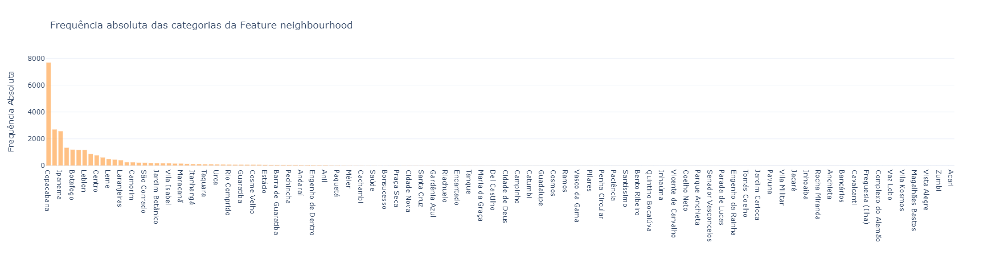

In [21]:
# Definindo o nome da variável a ser analisada.

col = 'neighbourhood'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'v'
)

In [22]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col = col, data = data)

,n,prop (%)
neighbourhood,,
Copacabana,7695,28.898152
Barra da Tijuca,2710,10.177257
Ipanema,2581,9.692805
Jacarepaguá,1350,5.069851
Botafogo,1204,4.521556
Recreio dos Bandeirantes,1186,4.453958
Leblon,1183,4.442692
Santa Teresa,885,3.323569
Centro,778,2.921737


O local mais frequentes é **Copacabana** aparecendo em **28.89%** dos registros do conjunto de dados. 

#### **4.2.2 Variável room_type**

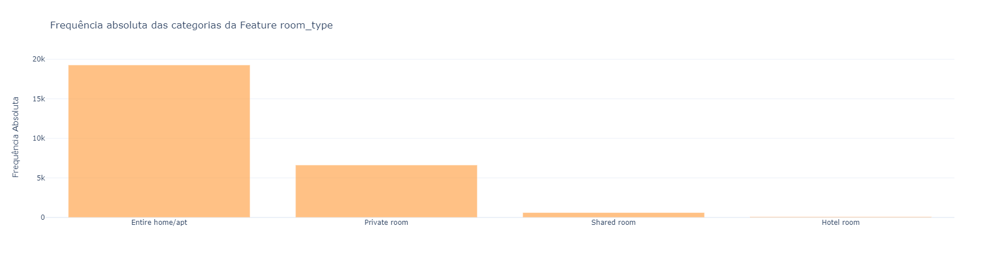

In [23]:
# Definindo o nome da variável a ser analisada.

col = 'room_type'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'v'
)

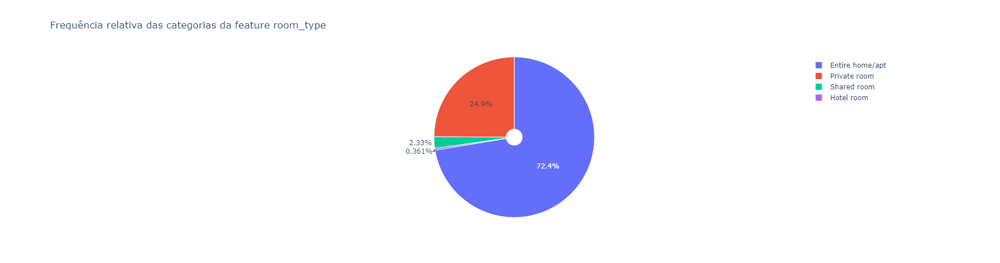

In [24]:
# Plotando um gráfico de pizza para a variável especificada.

plotPie (
    data  = dataCounts, 
    title = 'Frequência relativa das categorias da feature ' + col
)

In [25]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col = col, data = data)

,n,prop (%)
room_type,,
Entire home/apt,19280,72.404987
Private room,6632,24.906114
Shared room,620,2.328376
Hotel room,96,0.360523


A proporção de *casas ou apartamentos alugados* é abrange **72.4%** dos registros, em seguida encontramos *quartos privados* com **24.9%**. Para o processo de modelagem preditiva, o conjunto de dados está **desbalanceado**.

#### **4.2.3 Variável price**

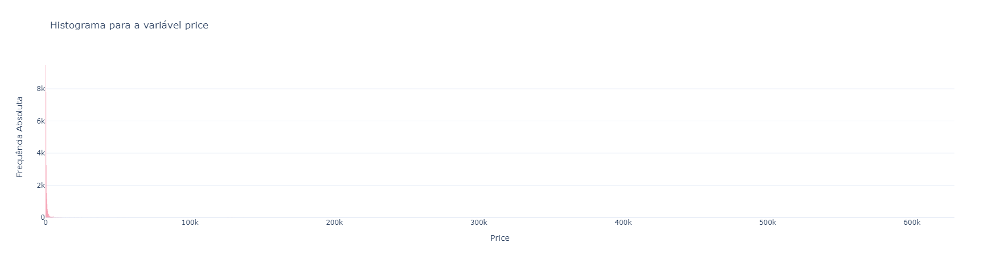

In [26]:
# Definindo o nome da variável a ser analisada.

col = 'price'

# Definindo a descrição da variável nos gráficos.

label = 'Price'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de histograma para a variável especificada.

plotHist (
    data = data[col],
    title = 'Histograma para a variável ' + col,
    xaxis = label,
    yaxis = 'Frequência Absoluta'
)

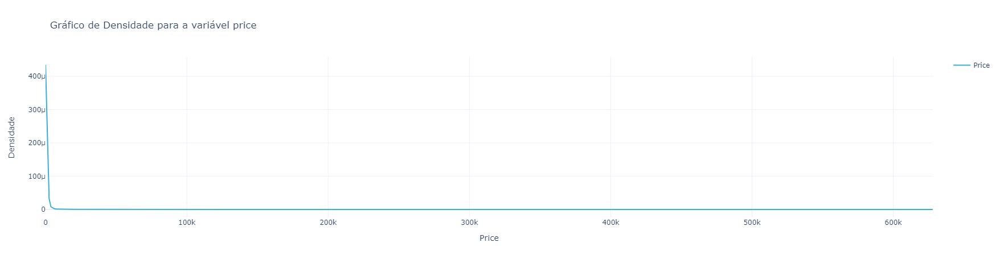

In [27]:
# Criando um gráfico de Densidade para a variável especificada.

plotDensity (
    data  = data[col], 
    title = 'Gráfico de Densidade para a variável ' + col, 
    xaxis = label
)

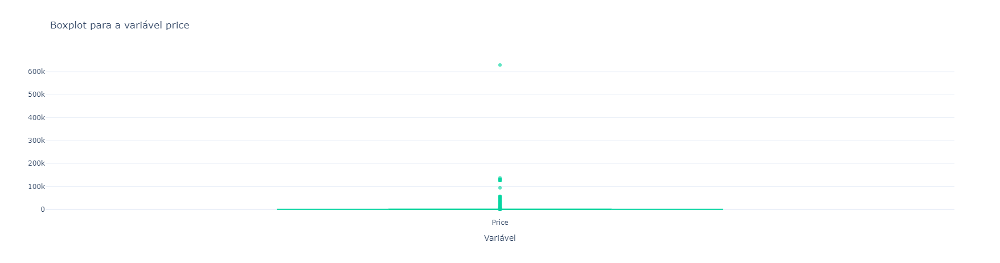

In [28]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Há um outlier que está distorcento drasticamente a distribuição do conjunto de dados dos preços. Vamos identificá-lo:

In [29]:
# Capturando os registros que contém o maior valor do conjunto de dados para a variável especificada.

data[data[col] == data[col].max()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
8270,13879989,Temporary rentals for Brazilian Cup.,82046629,Elizabeth,NaN,São Cristóvão,-22.90156,-43.22977,Shared room,629236,6,0,NaN,NaN,1,365


In [30]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
price,0,150.0,264.0,749.774148,536.0,5636.36845,62.134905,6020.659054


Destacamos que:
* A média e a mediana da idade apresentam valores muito diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.2.4 Variável Minimum Nights**

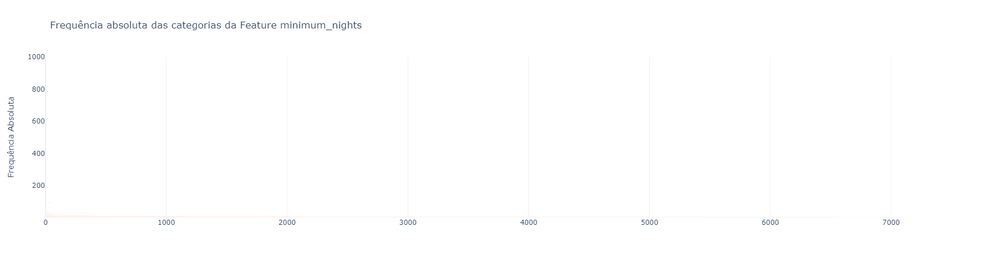

In [31]:
# Definindo o nome da variável a ser analisada.

col = 'minimum_nights'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

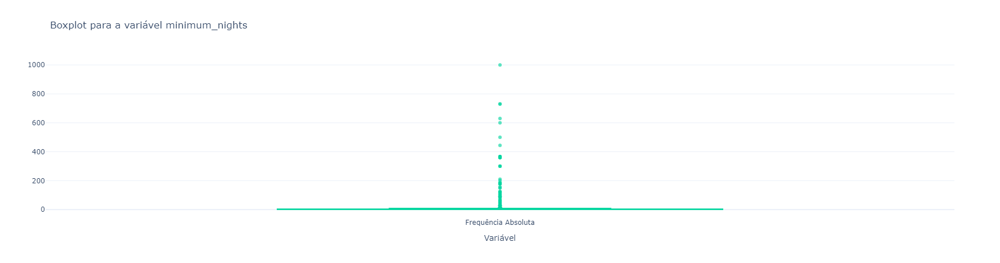

In [32]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Há um outlier que está distorcento drasticamente a distribuição do conjunto de dados dos preços. Vamos identificá-lo:

In [33]:
# Capturando os registros que contém o maior valor do conjunto de dados para a variável especificada.

data[data[col] == data[col].max()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
15816,32194774,"Apartamento com quarto amplo e silencioso, no ...",36208334,Leo,NaN,Copacabana,-22.96337,-43.17464,Entire home/apt,150,1000,4,2020-02-27,0.27,1,365


In [34]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
minimum_nights,1,1.0,2.0,4.749624,4.0,19.116195,22.482368,698.70274


Destacamos que:
* A média e a mediana da idade apresentam valores muito diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.2.5 Variável Number of Reviews**

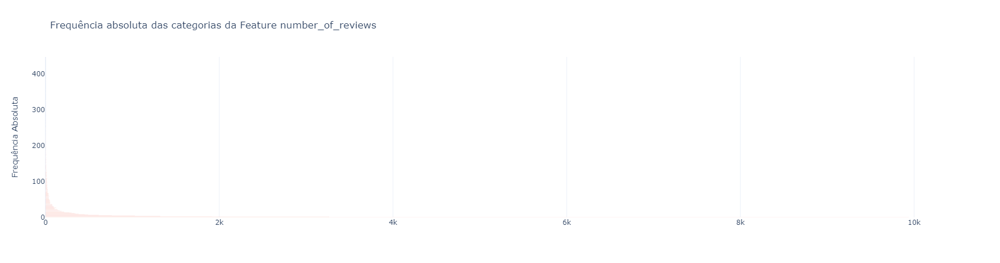

In [35]:
# Definindo o nome da variável a ser analisada.

col = 'number_of_reviews'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

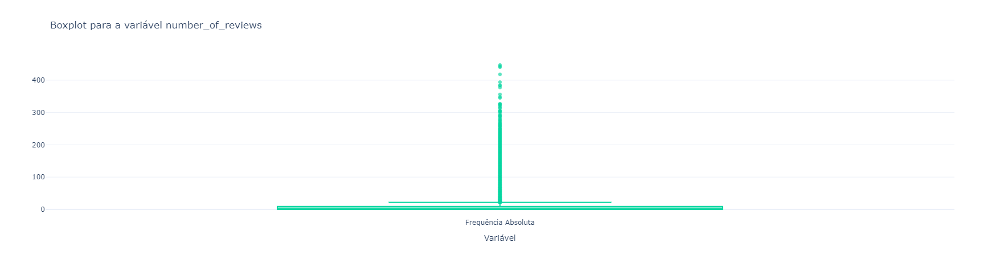

In [36]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

In [37]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
number_of_reviews,0,0.0,2.0,12.219543,9.0,29.876552,4.880999,33.470151


Destacamos que:
* A média e a mediana da idade apresentam valores muito diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.2.6 Variável Reviews per Month**

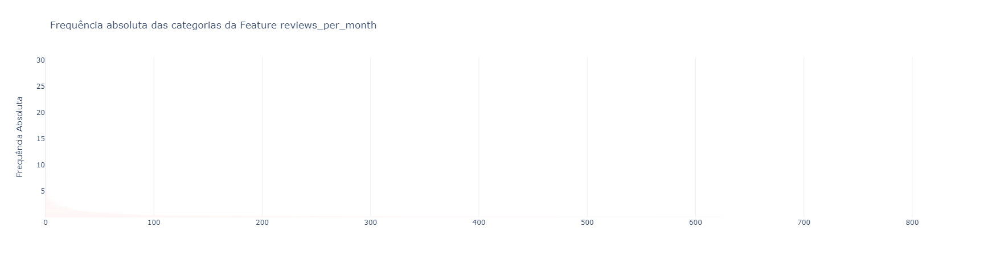

In [38]:
# Definindo o nome da variável a ser analisada.

col = 'reviews_per_month'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

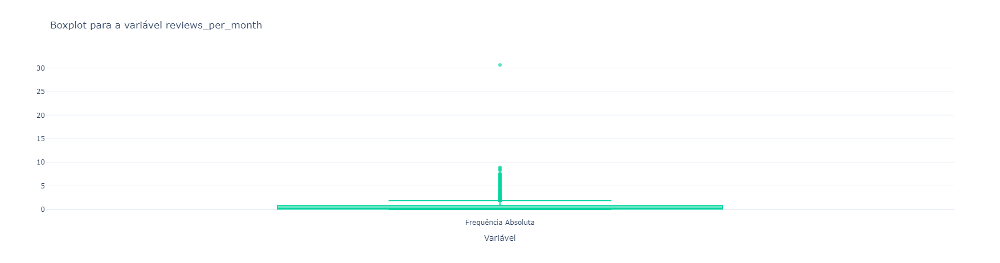

In [39]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

In [40]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
reviews_per_month,0.01,0.09,0.27,0.611649,0.81,0.860417,NaN,NaN


Destacamos que:
* A média e a mediana da idade apresentam valores próximos; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.2.7 Variável Calculated host listings count**

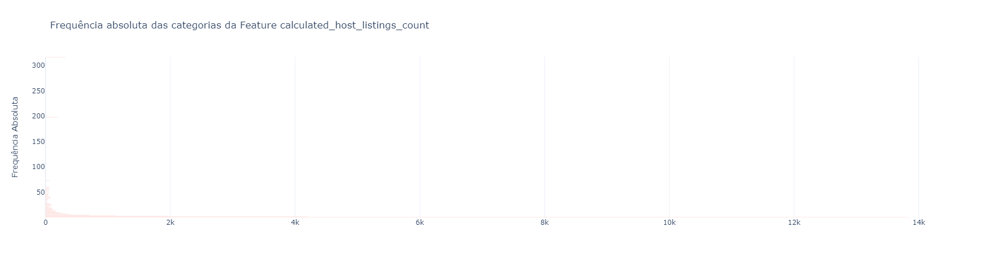

In [41]:
# Definindo o nome da variável a ser analisada.

col = 'calculated_host_listings_count'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    #xaxis       = 'Frequência Absoluta',
    orientation = 'h'
)

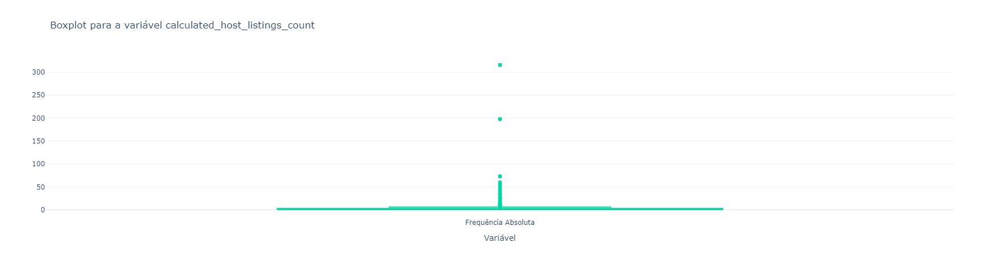

In [42]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

In [43]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
calculated_host_listings_count,1,1.0,1.0,10.021481,3.0,38.697792,6.756702,47.585322


Destacamos que:
* A média e a mediana da idade apresentam valores próximos; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.2.8 Variável calculated host listings count**

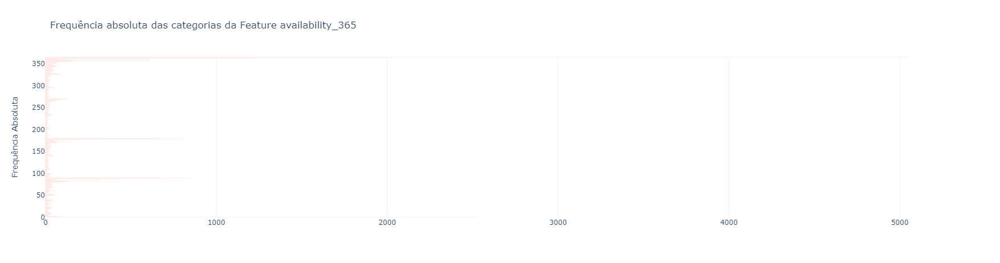

In [44]:
# Definindo o nome da variável a ser analisada.

col = 'availability_365'

# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

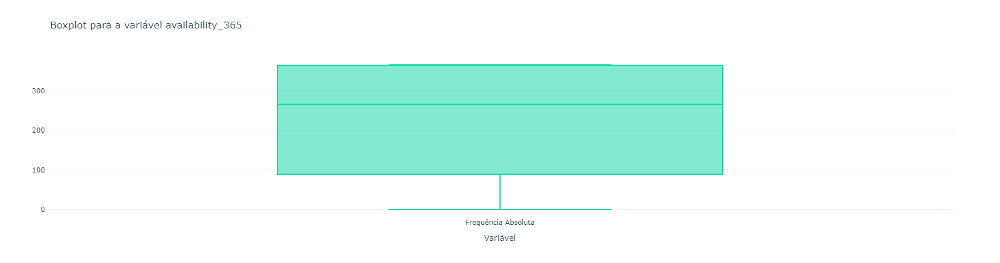

In [45]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

In [46]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
availability_365,0,89.0,266.0,226.596853,364.0,138.216789,-0.358957,-1.474147


Destacamos que:
* A média e a mediana da idade apresentam valores diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à esquerda;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais leve que a normal, ou seja, temos uma *curtose Platicúrtica*.


Iremos definir algumas funções, para padronizar as plotagens de gráficos que criaremos.

### **4.3 Explorando a distribuição de cada variável individualmente sem outliers**


#### **4.3.1 Variável price**

In [47]:
# Definindo o nome da variável a ser analisada.

col = 'price'

# Extraindo outliers do conjunto de dados da variável especificada.

data, outliers = extractOutliers(col = col, data = data)

# Visualizando os primeiros outliers do conjunto de dados especificado.

outliers.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5,48305,Bright 6bed Remote-work Ready Penthouse Second...,70933,Goitaca,NaN,Ipanema,-22.98591,-43.20302,Entire home/apt,1967,2,78,2021-03-05,0.64,8,349
9,50294,Ipanema Beach Block Suites Just Seconds from t...,70933,Goitaca,NaN,Ipanema,-22.98584,-43.20305,Entire home/apt,1312,2,73,2020-09-20,0.62,8,348
10,50759,4 Suites lake front Barra da Tijuca,233554,Felipe,NaN,Barra da Tijuca,-23.00307,-43.30911,Entire home/apt,3404,1,7,2017-01-08,0.11,4,365
13,65546,"Beach Block 3bed Penthouse, Ipanema Best Location",70933,Goitaca,NaN,Ipanema,-22.98599,-43.20299,Entire home/apt,1474,2,64,2021-02-02,0.52,8,348
53,118355,HOUSE IN GARDEN,523251,Humberto,NaN,Itanhangá,-22.98789,-43.31698,Private room,2143,2,2,2019-03-06,0.07,5,129
64,137150,Penthouse at Lagoa close to Ipanema,670788,Roberto,NaN,Lagoa,-22.97193,-43.20359,Entire home/apt,2754,21,0,NaN,NaN,1,365
80,176185,Penthouse Oceanview Copacab/Ipanema,842466,Wolfgang,NaN,Copacabana,-22.98499,-43.19098,Entire home/apt,1543,3,140,2020-03-12,1.22,1,365
83,181138,Stunning penthouse with ocean view and panoram...,868175,Yann,NaN,Copacabana,-22.98474,-43.19081,Entire home/apt,1176,4,63,2019-08-01,0.55,1,178
99,203674,"IPANEMA PENTHOUSE,JACUZZI + STUNNING CRISTO VI...",999125,Alastair,NaN,Ipanema,-22.98250,-43.20504,Entire home/apt,2252,5,48,2019-05-07,0.44,1,37
101,210173,"BEAUTIFUL! Spacious,all rooms",1030316,Elizabeth,NaN,Copacabana,-22.98596,-43.19001,Private room,1625,2,3,2019-10-03,0.03,4,365


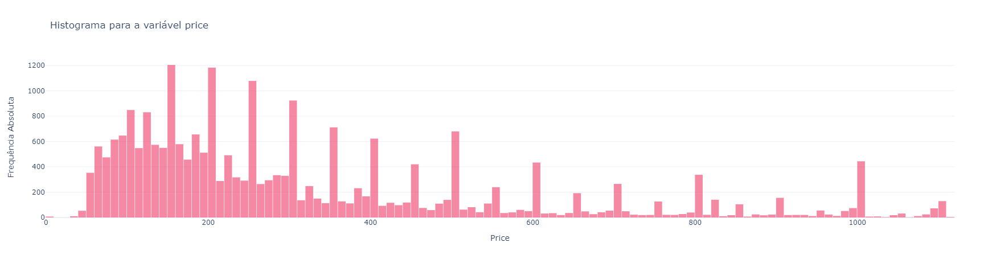

In [48]:
# Definindo a descrição da variável nos gráficos.

label = 'Price'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de histograma para a variável especificada.

plotHist (
    data = data[col],
    title = 'Histograma para a variável ' + col,
    xaxis = label,
    yaxis = 'Frequência Absoluta'
)

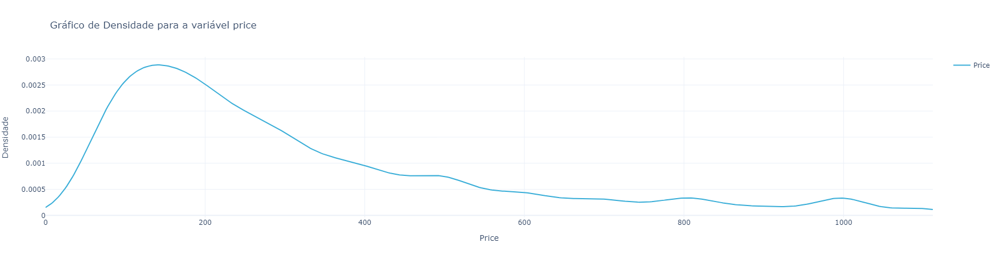

In [49]:
# Criando um gráfico de Densidade para a variável especificada.

plotDensity (
    data  = data[col], 
    title = 'Gráfico de Densidade para a variável ' + col, 
    xaxis = label
)

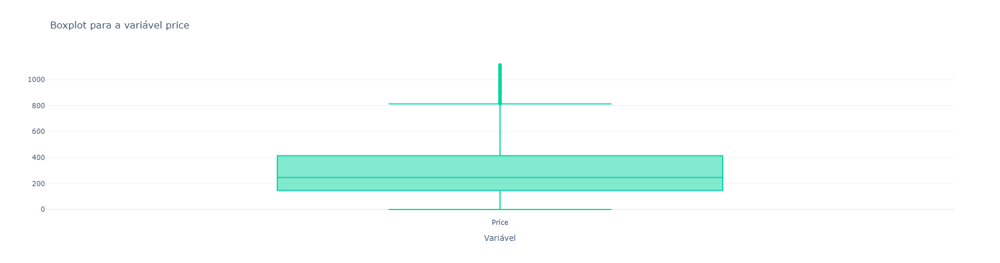

In [50]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Mesmo com a extração dos outliers, a distorção foi amenizada mas não eliminada, e por isso a assimetria do conjunto de dados continua alta.

In [51]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
price,0,147.0,247.0,319.976308,414.0,244.40349,1.370624,1.238373


Destacamos que:
* A média e a mediana da idade apresentam valores diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.3.2 Variável Minimum Nights**

In [52]:
# Definindo o nome da variável a ser analisada.

col = 'minimum_nights'

# Extraindo outliers do conjunto de dados da variável especificada.

data, outliers = extractOutliers(col = col, data = data)

# Visualizando os primeiros outliers do conjunto de dados especificado.

outliers.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
19,75585,Copacabana 2 BR Penthouse Duplex,401375,Stefan,NaN,Copacabana,-22.98238,-43.19366,Entire home/apt,401,10,101,2020-02-24,0.83,1,270
49,107469,Quarto confortável com vista panorâmica,556738,Casa Da Carmen E,NaN,Santa Teresa,-22.91831,-43.17850,Private room,54,60,2,2018-12-21,0.02,4,117
81,178833,Penthouse #1! Best Internet! Veranda! Expat US-DE,856145,Mario,NaN,Copacabana,-22.98026,-43.19109,Private room,125,10,108,2021-03-09,0.92,3,217
82,178951,Penthouse #2! Best Internet! Veranda! Expat US-DE,856145,Mario,NaN,Copacabana,-22.97858,-43.19075,Entire home/apt,111,10,84,2021-02-27,0.72,3,257
141,273363,Lindo quarto para longas temporadas,556738,Casa Da Carmen E,NaN,Santa Teresa,-22.91892,-43.18080,Private room,48,90,4,2017-12-04,0.05,4,326
144,273753,Beautiful room for students,556738,Casa Da Carmen E,NaN,Santa Teresa,-22.91676,-43.18070,Private room,48,50,2,2016-11-03,0.02,4,267
173,295955,Acogedor departamento en un barrio precioso de...,1527388,NaN,NaN,Laranjeiras,-22.93352,-43.18117,Entire home/apt,132,29,16,2020-03-06,0.14,1,183
246,404674,"In the heart of our beautiful city…Oh, yeah!",261954,Elisa,NaN,Flamengo,-22.93990,-43.17574,Private room,347,30,115,2017-03-02,1.06,3,52
248,404811,BAND NEW APT COPACABANA,581488,Carlos,NaN,Copacabana,-22.97668,-43.19373,Private room,150,90,0,NaN,NaN,3,365
288,471651,Jupiter Home at Botafogo,918340,Flávia,NaN,Botafogo,-22.94939,-43.18250,Entire home/apt,800,15,17,2020-01-26,0.17,2,362


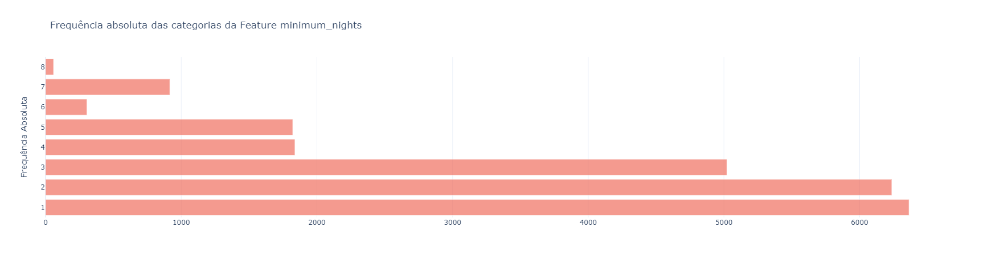

In [53]:
# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

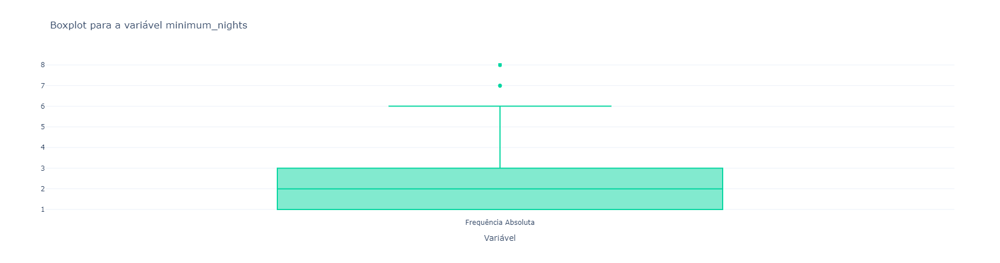

In [54]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Após a remoção dos outliers, a distribuição do conjunto de dados se tornou mais clara.

In [55]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
minimum_nights,1,1.0,2.0,2.618446,3.0,1.581212,1.113554,0.807375


Destacamos que:
* A média e a mediana da idade apresentam valores próximos; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.3.3 Variável Number of Reviews**

In [56]:
# Definindo o nome da variável a ser analisada.

col = 'number_of_reviews'

# Extraindo outliers do conjunto de dados da variável especificada.

data, outliers = extractOutliers(col = col, data = data)

# Visualizando os primeiros outliers do conjunto de dados especificado.

outliers.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,17878,"Very Nice 2Br in Copacabana w. balcony, fast WiFi",68997,Matthias,NaN,Copacabana,-22.96592,-43.17896,Entire home/apt,200,5,260,2021-02-08,2.00,1,334
1,24480,Nice and cozy near Ipanema Beach,99249,Goya,NaN,Ipanema,-22.98570,-43.20193,Entire home/apt,307,3,85,2018-02-14,0.67,1,37
2,35636,Cosy flat close to Ipanema beach,153232,Patricia,NaN,Ipanema,-22.98816,-43.19359,Entire home/apt,275,2,181,2020-03-15,2.00,1,236
3,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,Patricia Miranda & Paulo,NaN,Copacabana,-22.98127,-43.19046,Entire home/apt,120,3,356,2021-03-06,2.79,1,120
6,48726,Rio de Janeiro Copacabana Ipanema,221941,Vana,NaN,Ipanema,-22.98414,-43.19450,Private room,110,3,42,2019-08-08,1.02,1,43
8,49179,Djalma Ocean View Studio with Amazing Views #100A,224192,David,NaN,Copacabana,-22.97910,-43.19008,Entire home/apt,150,3,96,2021-02-17,0.95,38,106
11,51703,"Ocean view, block of the beach, Copacabana,Ipa...",238091,Dália,NaN,Copacabana,-22.98128,-43.19091,Entire home/apt,140,3,166,2021-03-14,1.58,2,297
15,66797,Studio Apart for rent in ipanema.,328096,Carlos,NaN,Ipanema,-22.98463,-43.19563,Entire home/apt,145,3,211,2021-03-19,1.73,3,245
16,68422,Copacabana Beach Living+AirConWiFi,339264,David,NaN,Copacabana,-22.98498,-43.19135,Private room,215,4,79,2017-11-22,0.64,1,90
17,70080,Apart-hotel in Ipanema with service and garage,319672,Valeria,NaN,Ipanema,-22.98540,-43.19602,Entire home/apt,230,2,383,2021-03-16,3.41,5,267


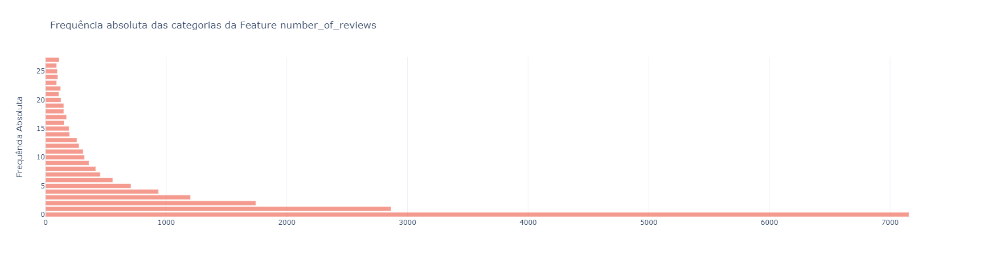

In [57]:
# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

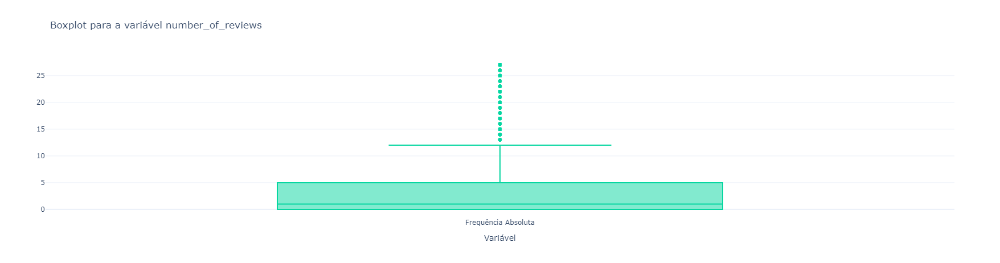

In [58]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Mesmo com a extração dos outliers, a distorção foi amenizada mas não eliminada, e por isso a assimetria do conjunto de dados continua alta.

In [59]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
number_of_reviews,0,0.0,1.0,4.138114,5.0,6.091122,1.883798,2.957115


Destacamos que:
* A média e a mediana da idade apresentam valores diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.3.4 Variável Reviews per Month**

In [60]:
# Definindo o nome da variável a ser analisada.

col = 'reviews_per_month'

# Extraindo outliers do conjunto de dados da variável especificada.

data, outliers = extractOutliers(col = col, data = data)

# Visualizando os primeiros outliers do conjunto de dados especificado.

outliers.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
233,380887,COPACABANA ENTRE AS PRAIAS DE IPANEMA E ARPOADOR,1910409,Leandro,NaN,Ipanema,-22.98640,-43.19280,Entire home/apt,190,5,20,2021-02-17,1.21,1,76
1962,2536745,Cobertura com Vista Cinematográfica,12989490,Christoph,NaN,Lagoa,-22.96526,-43.19925,Entire home/apt,786,2,17,2020-08-15,1.11,1,81
2081,2614283,Small building in heart of Leblon,13387287,Jose,NaN,Leblon,-22.98213,-43.22213,Entire home/apt,107,1,20,2021-02-18,1.06,2,353
2095,2620853,"Apart. inteiro 2 quartos, no verde de Copacabana",13421949,Marcelo,NaN,Copacabana,-22.96398,-43.19136,Entire home/apt,320,2,2,2021-02-21,1.67,1,350
2409,2809851,Copacabana facing the beach - amazing view,14279272,Flavio,NaN,Copacabana,-22.97603,-43.18832,Entire home/apt,124,2,25,2021-03-08,1.05,4,344
2499,2861214,STUDIO IPANEMA RUA JOAQUIM NABUCO,13392098,Vinicio,NaN,Ipanema,-22.98759,-43.19502,Entire home/apt,175,3,27,2021-03-22,1.04,18,351
2618,2940697,GLÓRIA INDUSTRIAL HOME - metrô Glória 50m,15013867,Fernanda,NaN,Glória,-22.92058,-43.17742,Entire home/apt,94,2,4,2021-03-17,1.35,2,361
2834,3066861,Recreio Paradisíaco,13387287,Jose,NaN,Recreio dos Bandeirantes,-23.02324,-43.47211,Entire home/apt,150,1,6,2021-03-02,1.07,2,355
3938,5536594,Copacabana Beautiful 1/1,26021340,Luciano,NaN,Copacabana,-22.96390,-43.17830,Entire home/apt,120,5,24,2020-12-02,1.03,1,310
4273,7128551,Apartamento Alto Astral com 2 qtos em Ipanema,13411812,Fernando,NaN,Ipanema,-22.98296,-43.19793,Entire home/apt,210,2,5,2021-02-18,2.46,2,359


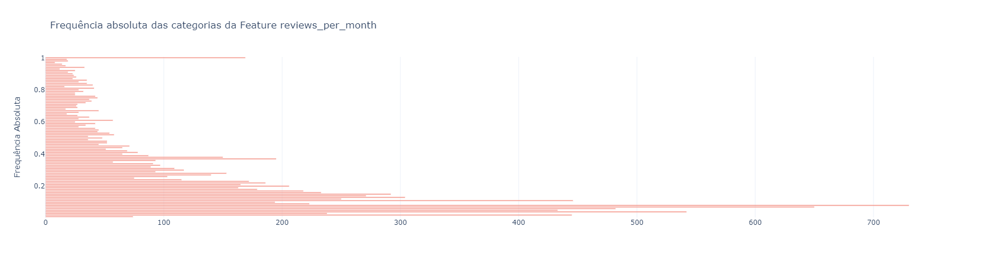

In [61]:
# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

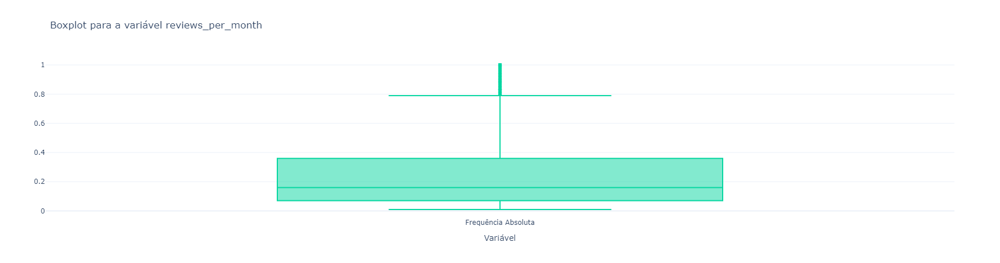

In [62]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Mesmo com a extração dos outliers, a distorção foi amenizada mas não eliminada, e por isso a assimetria do conjunto de dados continua alta.

In [63]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
reviews_per_month,0.01,0.07,0.16,0.252085,0.36,0.244595,1.435388,1.262951


Destacamos que:
* A média e a mediana da idade apresentam valores próximos; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


#### **4.3.5 Variável Calculated host listings count**

In [64]:
# Definindo o nome da variável a ser analisada.

col = 'calculated_host_listings_count'

# Extraindo outliers do conjunto de dados da variável especificada.

data, outliers = extractOutliers(col = col, data = data)

# Visualizando os primeiros outliers do conjunto de dados especificado.

outliers.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
43,97636,Rio de Janeiro for you! Go for it!,496656,Marcia Longras,NaN,Botafogo,-22.94169,-43.18703,Private room,128,8,17,2019-10-07,0.15,11,365
128,251701,LEBLON BEACHFRONT VILLA APT.2,1319991,NaN,NaN,Vidigal,-22.99176,-43.23313,Entire home/apt,549,7,27,2019-11-13,0.24,8,365
152,280625,"Fascinating Rio, on the hills!",496656,Marcia Longras,NaN,Botafogo,-22.94265,-43.18768,Private room,138,3,21,2020-01-04,0.19,11,365
162,286788,triple ocean view room in copacaban,1429181,Samuel,NaN,Copacabana,-22.96633,-43.17754,Private room,226,2,19,2020-02-29,0.17,9,329
163,286792,triple ocean view room in copacaban,1429181,Samuel,NaN,Copacabana,-22.96577,-43.17648,Private room,200,2,1,2019-01-02,0.04,9,326
164,288758,517 Studio in Copacabana available,1500426,Cristyna Rio,NaN,Copacabana,-22.98482,-43.19077,Entire home/apt,150,5,25,2020-12-22,0.22,51,365
165,289898,double/twin ocean view room in copa,1429181,Samuel,NaN,Copacabana,-22.96633,-43.17754,Private room,150,2,4,2019-01-01,0.07,9,326
197,324679,Rio from the hill!,496656,Marcia Longras,NaN,Botafogo,-22.94231,-43.18528,Private room,98,5,13,2018-09-04,0.13,11,364
252,409038,Copa Penthouse - 1 Bed Studio,1603206,Bob,NaN,Copacabana,-22.96778,-43.18204,Entire home/apt,144,3,10,2019-11-01,0.12,7,304
257,419204,LEBLON BEACHFRONT VILLA Apt.4,1319991,NaN,NaN,São Conrado,-22.99578,-43.25397,Entire home/apt,659,5,8,2018-12-31,0.07,8,365


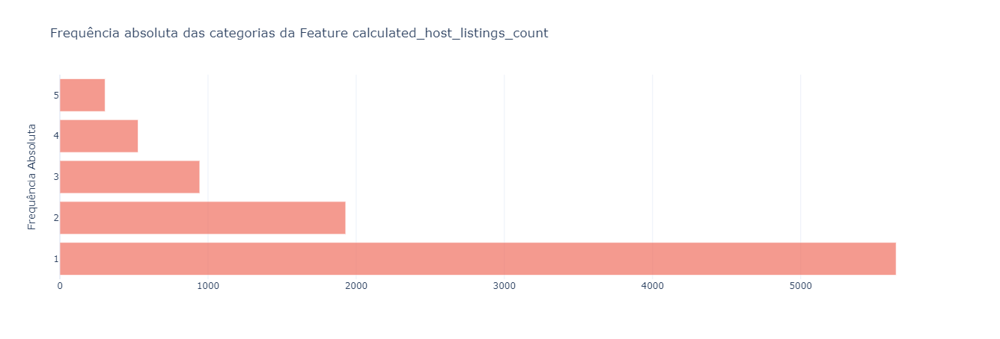

In [65]:
# Definindo a descrição da variável nos gráficos.

label = 'Frequência Absoluta'

# Contabilizando a frequência absoluta de cada categoria presente na variável especificada.

dataCounts = data[col].value_counts()

# Plotando um gráfico de barras para as variáveis especificadas.

plotBar (
    data        = dataCounts,
    title       = 'Frequência absoluta das categorias da Feature ' + col, 
    yaxis       = label, 
    orientation = 'h'
)

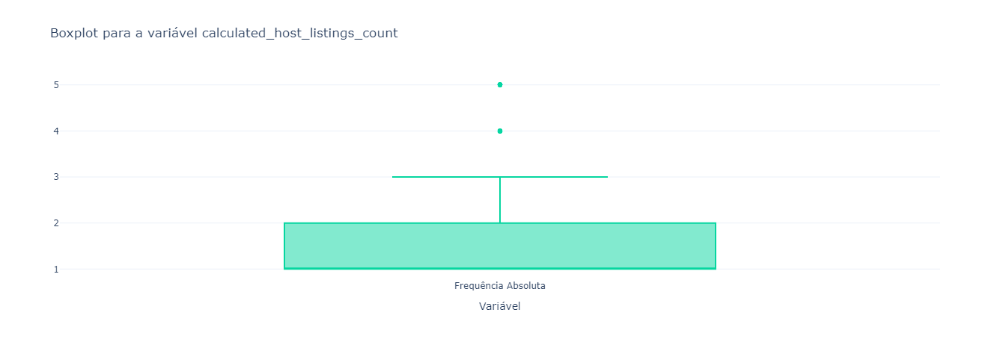

In [66]:
# Plotando um gráfico de boxplot para as variável especificada.

plotBoxplot (
    data  = data[[col]],
    title = 'Boxplot para a variável ' + col,
    xaxis = 'Variável',
    name  = label
)

Mesmo com a extração dos outliers, a distorção foi amenizada mas não eliminada, e por isso a assimetria do conjunto de dados continua alta.

In [67]:
# Calculando algumas estatísticas para a variável especificada.

varStats(col, data = data)

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
calculated_host_listings_count,1,1.0,1.0,1.708128,2.0,1.067238,1.52373,1.489535


Destacamos que:
* A média e a mediana da idade apresentam valores diferentes; 
* O coeficiente de assimetria (**Sk**) confirma que os dados apresentam uma assimetria à direita;
* O coeficiente de curtose (**Ck**) evidência que a calda é mais pesada que a normal, ou seja, temos uma *curtose Leptocúrtica*.


In [68]:
# Adicionando dados sem outliers a linhagem do conjunto de dados

allData['withoutOutliers'] = data.copy()

## **5. Feature Selection**

### **5.1 Criando funções auxiliares**

In [69]:
# Definindo uma função para para aplicar as transformações MimMaxScaler, StandardScaler, 
# Yeo-Johnson e Normalize as features de um conjunto de dados de treino e de teste.

def dataTransform(train, test, transform = 'MM'):

    # Criando cópias dos DataFrames.

    trainFeatures = train.copy()
    testFeatures  = test.copy()
    
    # Criando um variável para identificar os dados de treino e de teste.

    trainFeatures['train'] = 1
    testFeatures['train']  = 0

    # Unindo dados de treino e de teste em um único conjunto de dados.

    features = pd.concat([trainFeatures, testFeatures])

    # Capturando a variável que identifica os dados de treino e de teste.

    train = features['train']

    # Eliminando a variável de identificação do Dataframe.

    features = features.drop('train', axis = 1)

    # Criando variável para armazenar o conjunto de dados transformado.

    featuresTransformed = None

    # Aplicando a transformação selecionada.

    if transform == 'MM':
        
        # Criando um objeto da classe MinMaxScaler().

        scaler = MinMaxScaler()

        # Aplicando a escala nas Features e capturando o resultado obtido.

        featuresTransformed = scaler.fit_transform(features)

        # Criando um DataFrame com os resultados obtidos.

        featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = features.columns)
    
    elif transform == 'SS':

        # Criando um objeto da classe StandardScaler().

        scaler = StandardScaler()

        # Aplicando a escala nas Features e capturando o resultado obtido.

        featuresTransformed = scaler.fit_transform(features)

        # Criando um DataFrame com os resultados obtidos.

        featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = features.columns)
    
    elif transform == 'ND':

        # Criando um objeto da classe StandardScaler().

        scaler = StandardScaler()

        # Aplicando a escala nas Features e capturando o resultado obtido.

        featuresTransformed = scaler.fit_transform(features)

        # Criando um DataFrame com os resultados obtidos.

        featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = features.columns)

        # Criando um objeto da classe PowerTransformer().

        scaler = PowerTransformer(method = 'yeo-johnson', standardize = False)

        # Aplicando a escala nas Features e capturando o resultado obtido.

        featuresTransformed = scaler.fit_transform(featuresTransformed)

        # Criando um DataFrame com os resultados obtidos.

        featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = features.columns)
    
    elif transform == 'N':

        # Normalizando cada feature para uma unidade uniforme (vetor unitário).

        featuresTransformed = normalize(features, axis = 0)

        # Criando um DataFrame com os resultados obtidos.

        featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = features.columns)

    # Atribuindo variável identificadora ao DataFrame transformado.

    featuresTransformed['train'] = train.values

    # Separando dados de treino e de teste transformados.

    trFeatures  = featuresTransformed[featuresTransformed['train'] == 1].drop('train', axis = 1)
    tstFeatures = featuresTransformed[featuresTransformed['train'] == 0].drop('train', axis = 1)

    # Retornando dados de treino e teste transformados.

    return trFeatures, tstFeatures

In [70]:
# Definindo função para aplicar a técnica PCA a um conjunto de dados de treino e teste.

def pcaTransform(train, test, nComponents = 8):

    # Criando cópias dos DataFrames.

    trainFeatures = train.copy()
    testFeatures  = test.copy()
    
    # Criando um variável para identificar os dados de treino e de teste.

    trainFeatures['train'] = 1
    testFeatures['train']  = 0

    # Unindo dados de treino e de teste em um único conjunto de dados.

    features = pd.concat([trainFeatures, testFeatures])

    # Capturando a variável que identifica os dados de treino e de teste.

    train = features['train']

    # Eliminado a variável de identificação do Dataframe.

    features = features.drop('train', axis = 1)

    # Criando variável para armazenar o conjunto de dados transformados.

    featuresTransformed = None

    # Normalizando cada feature para uma unidade uniforme (vetor unitário).

    featuresTransformed = normalize(features, axis = 0)

    # Instanciando um objeto da classe PCA para criar os componentes.

    pca = PCA(n_components = nComponents)

    # Capturando os componentes.

    featuresTransformed = pca.fit_transform(featuresTransformed)

    # Criando um DataFrame com os resultados obtidos.

    featuresTransformed = pd.DataFrame(data = featuresTransformed, columns = ['PCA_' + str(i) for i in range(0, nComponents)])

    # Atribuindo variável identificadora ao DataFrame transformado.

    featuresTransformed['train'] = train.values

    # Separando dados de treino e de teste transformados.

    trFeatures  = featuresTransformed[featuresTransformed['train'] == 1].drop('train', axis = 1)
    tstFeatures = featuresTransformed[featuresTransformed['train'] == 0].drop('train', axis = 1)

    # Retornando dados de treino e teste transformados.

    return trFeatures, tstFeatures

### **5.2 Extraindo Features dos conjuntos de dados**

Nesta etapa, iremos segmentar os registros em dados de treino e de teste. Mas, primeiro iremos criar diferentes conjuntos de dados como base no dataset original.

In [71]:
# Criando conjunto de dados como a coluna positions original.

allData['position'] = allData['raw'].drop(['id', 'host_id', 'neighbourhood_group', 'last_review', 'name', 'host_name'], axis = 1)

# Criando conjunto de dados como a coluna positions sem outliers.

allData['posWithoutNa'] = allData['raw'].drop(['id', 'host_id', 'neighbourhood_group', 'last_review', 'name', 'host_name'], axis = 1).dropna()

# Criando conjunto de dados sem valores nulos.

allData['posWithNa'] = allData['raw'].drop(['id', 'host_id', 'neighbourhood_group', 'last_review', 'name', 'host_name'], axis = 1)

# Criando conjunto de dados sem valores nulos e sem a coluna host_name.

allData['posWithoutLNa'] = allData['raw'].drop(['id', 'host_id', 'neighbourhood_group',  'last_review', 'name'], axis = 1).dropna()

# Criando conjunto de dados sem a coluna reviews_per_month. 

allData['withoutRevPerMonth'] = allData['raw'].drop(['id', 'host_id', 'neighbourhood_group', 'last_review', 'name', 'host_name', 'reviews_per_month'], axis = 1)

In [72]:
# Varrendo duas versões do conjunto de dados dentro do conjunto de linhagem.

for cl in ['posWithoutNa', 'posWithNa']:

    # Capturando o conjunto de dados especificado.

    dt = allData[cl]

    # Iterando cada um dos nomes das variáveis especificadas.

    for columns in dt.columns:
        
        # Convertendo as variáveis especificadas em valores numéricos.

        if columns in ['last_review','host_name', 'neighbourhood', 'room_type']:
            
            # Convertendo o tipo de dados especificado para o tipo de dado categórico.
            
            dt[columns] = dt[columns].astype('category')
            
            # Capturando os valores numéricos das variáveis especificadas.

            dt[columns] = dt[columns].cat.codes

    # Adicionando a versão atualizada do conjunto de dados na lista de linhagem.
    
    allData[cl] = dt

In [73]:
# Capturando o conjunto de dados com valores nulo.

dt = allData['posWithNa'].copy()

# Iterando o nome das colunas do conjunto de dados.
for col in [i for i in dt.columns if i != 'room_type']: 
    
    # Capturando o valor mínimo e máximo do conjunto de dados.

    vMin, vMax = dt[col].min(), dt[col].max()

    # Normalizando o conjunto de dados da variável especificada.

    dt[col] = [(i - vMin) / (vMax - vMin) if not np.isnan(i) else i for i in dt[col]]

# Adicionando o conjunto de dados escalado com dados nulos presentes.

allData['posWithNaMM'] = dt

In [74]:
# Definindo o conjunto de dados, dentro da linhagem, que será utilizado para gerar os modelos de machine learning.

data = allData['posWithoutNa'].copy()

Iremos definir **80%** do conjunto de dados para *treino* e **20%** para *teste*.

In [75]:
# Criando conjunto de dados de treino e de teste.

trainFeatures, testFeatures, trainTarget, testTarget = train_test_split(data.drop('room_type', axis = 1), data['room_type'], test_size = 0.20)

In [76]:
# Verificando as novas dimensões do DataFrame de treino.

trainFeatures.shape

(13349, 9)

In [77]:
# Verificando as novas dimensões do DataFrame de teste.

testFeatures.shape

(3338, 9)

### **5.3 Aplicando diferentes escalas as Features de Treino e de Teste**

Iremos aplicar diferentes transformações, nas variáveis preditoras dos conjuntos de dados de treino e de teste.

In [78]:
# Aplicando a transformação MinMaxScaler, as Features do conjunto de dados de treino e de teste.

trainFeaturesMM, testFeaturesMM = dataTransform (
    train     = trainFeatures,
    test      = testFeatures,
    transform = 'MM'
)

In [79]:
# Aplicando a transformação StandardScaler, as Features do conjunto de dados de treino e de teste.

trainFeaturesSS, testFeaturesSS = dataTransform (
    train     = trainFeatures,
    test      = testFeatures,
    transform = 'SS'
)

In [80]:
# Aplicando a transformação Yeo-Johnson, as Features do conjunto de dados de treino e de teste.

trainFeaturesNormDistribuition, testFeaturesNormDistribuition = dataTransform (
    train     = trainFeatures,
    test      = testFeatures,
    transform = 'ND'
)

In [81]:
# Aplicando a transformação Normalize, as Features do conjunto de dados de treino e de teste.

trainFeaturesNormalized, testFeaturesNormalized = dataTransform (
    train     = trainFeatures,
    test      = testFeatures,
    transform = 'N'
)

### **5.4 Aplicando técnicas de Features Selection**

Aplicaremos diferentes técnicas de *Feature Selection*, para determinar qual é a melhor combinação de variáveis preditoras a ser utilizada.

#### **5.4.1 SelectKBest**

Este método seleciona recursos de acordo com as **k** pontuações mais altas.

In [82]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe SelectKBest, para selecionar as melhores variáveis preditoras.

skb = SelectKBest(chi2, k = tFeatures.shape[1])

# Capturando os scores das variáveis preditoras.

bestFeatuesSKB = skb.fit_transform(tFeatures, trainTarget)

# Capturando o nome das variáveis preditoras.

bfSkb = tFeatures.columns[skb.get_support()]

# Exibindo o nome das variáveis preditoras.

bfSkb

Index(['neighbourhood', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [83]:
# Criando um DataFrame, com os scores obtidos para cada uma das Features, segundo a técnica utilizada.

sc = pd.Series(skb.scores_, index = tFeatures.columns)

# Capturando os scores das variáveis preditoras.

sc = sc[skb.get_support()]

# Ordenando o Dataframe com os scores.

sc = sc.sort_values(ascending = False)

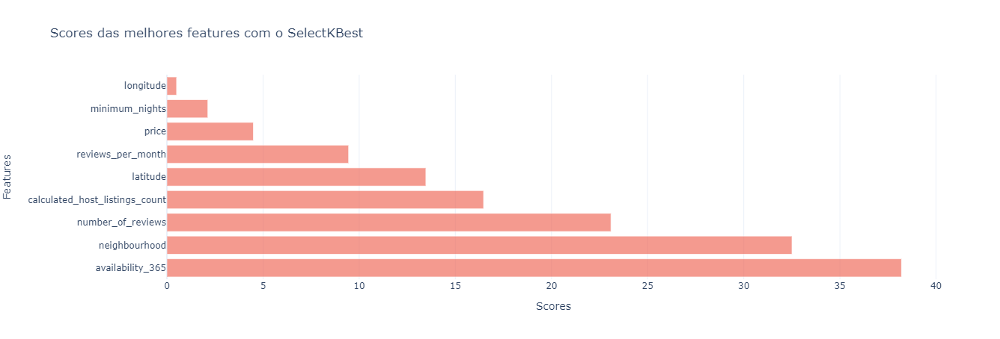

In [84]:
# Plotando um gráfico de barras, dos scores gerados para as features, a partir da técnica utilizada.

plotBar (
    data        = sc,
    title       = 'Scores das melhores features com o SelectKBest', 
    yaxis       = 'Features', 
    xaxis       = 'Scores',
    orientation = 'h'
)

Segundo o método **Select K Best**, as variáveis **availability_365**, **neighbourhood** e **number_of_reviews** são as mais importantes.

#### **5.4.2 Information Gain**

O **Information gain ou Mutual information** mede quanta informação a *presença / ausência* de um recurso contribui para fazer a previsão correta da variável *target*.

In [85]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe mutual_info_classif.

bestFeatuesIG = mutual_info_classif(tFeatures, trainTarget, discrete_features = 'auto', n_neighbors = 3)

# Inserindo Scores obtidos em uma Série temporal.

scoreFeatures = pd.Series(bestFeatuesIG, index = tFeatures.columns)

# Capturando os scores das variáveis preditoras em ordem decrescente.

bfIg = scoreFeatures.sort_values(ascending = False)

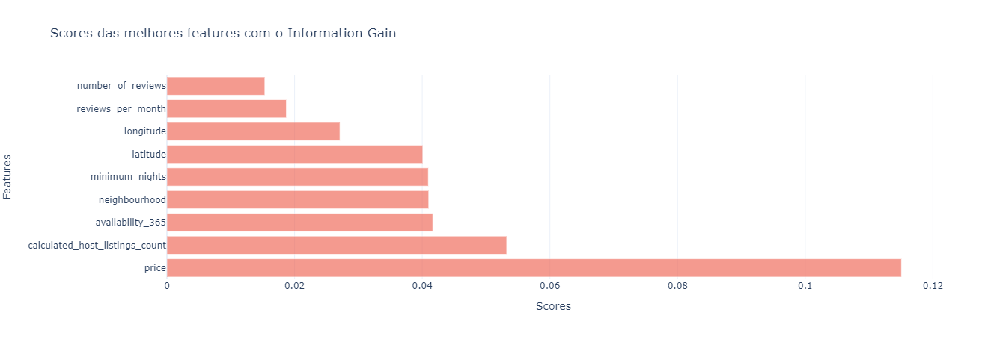

In [86]:
# Plotando um gráfico de barras, dos scores gerados para as features, a partir da técnica utilizada.

plotBar (
    data        = bfIg,
    title       = 'Scores das melhores features com o Information Gain', 
    yaxis       = 'Features', 
    xaxis       = 'Scores', 
    orientation = 'h'
)

Segundo o método **Information Gain**, as variáveis **price**, **minimum_nights** e **neighbourhood** são as mais importantes.

In [87]:
# Capturando o nome das variáveis preditoras.

bfIg = bfIg.index

# Exibindo o nome das variáveis preditoras.

bfIg

Index(['price', 'calculated_host_listings_count', 'availability_365',
       'neighbourhood', 'minimum_nights', 'latitude', 'longitude',
       'reviews_per_month', 'number_of_reviews'],
      dtype='object')

#### **5.4.3 ANOVA F-value**

Se os recursos forem categóricos, calcularemos uma **estatística qui-quadrado** entre cada recurso e a variável *target*. No entanto, se os recursos forem quantitativos, calcularemos a **ANOVA F-Value** entre cada recurso e a variável *target*.

As pontuações do **F-Value** examinam se, quando agrupamos a característica numérica pela variável *target*, as médias para cada grupo se tornam significativamente diferentes.

In [88]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe SelectKBest para selecionar as melhores variáveis preditoras a partir dos scores ANOVA F-Values.

skb = SelectKBest(f_classif, k = tFeatures.shape[1])

# Capturando as variáveis preditoras.

bestFeatuesANOVA = skb.fit_transform(tFeatures, trainTarget)

# Capturando o nome das variáveis preditoras.

bfAnova = tFeatures.columns[skb.get_support()]

# Exibindo o nome das variáveis preditoras.

bfAnova

Index(['neighbourhood', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [89]:
# Criando uma Série Temporal com os scores obtidos para cada uma das Features segundo a técnica utilizada.

sc = pd.Series(skb.scores_, index = tFeatures.columns)

# Capturando os scores das variáveis preditoras.

sc = sc[skb.get_support()]

# Ordenando a Série Temporal em ordem decrescente dos scores.

sc = sc.sort_values(ascending = False)

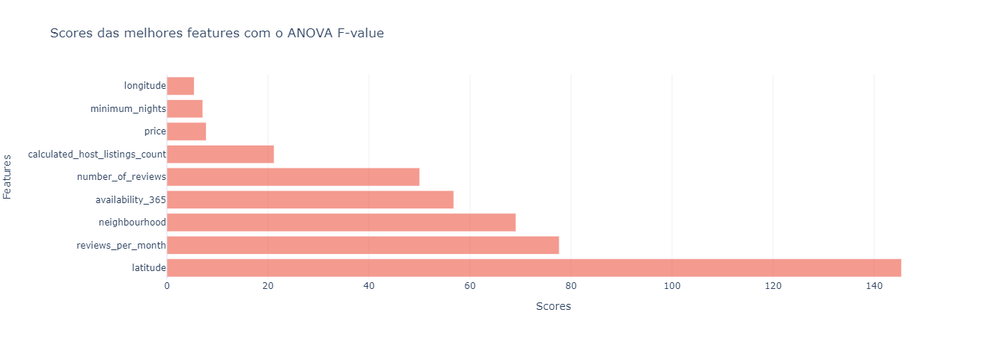

In [90]:
# Plotando um gráfico de barras, dos scores gerados para as features, a partir da técnica utilizada.

plotBar (
    data        = sc,
    title       = 'Scores das melhores features com o ANOVA F-value', 
    yaxis       = 'Features', 
    xaxis       = 'Scores', 
    orientation = 'h'
)

Segundo o método **ANOVA F-Value**, as variáveis **latitude**, **reviews_per_month** e **neighbourhood** são as mais importantes.

#### **5.4.4 Forward Selection**

O **Forward Selection** é um método iterativo, no qual começamos sem ter nenhum recurso no modelo. A cada iteração, adicionamos uma variável que melhora o modelo e efetuamos este procedimento até que a performance do modelo pare de evoluir.

A seleção de recursos começa avaliando todas as variáveis **individualmente**, e seleciona aquela que gera o algoritmo com o melhor desempenho, de acordo com um critério de avaliação predefinido. Em seguida, se avalia todas as combinações possíveis **das variáveis já selecionadas e dos recursos ainda não escolhidos** para definir a combinação que produz o algoritmo com a melhor performance, com base nos mesmos critérios predefinidos.

In [91]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe SFS para selecionar as melhores variáveis preditoras segundo sua acurácia, utilizando o algoritmo XGBClassifer.

sfs = SFS (
    estimator  = xgb.XGBClassifier(), 
    k_features = tFeatures.shape[1],
    forward    = True, 
    floating   = False, 
    verbose    = 2,
    scoring    = 'accuracy',
    cv         = 3
)

# Capturando as variáveis preditoras.

sfs = sfs.fit(
    X = tFeatures, 
    y = trainTarget
)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:   12.5s finished

[2021-05-24 18:38:51] Features: 1/9 -- score: 0.7798340914046249[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   13.2s finished

[2021-05-24 18:39:04] Features: 2/9 -- score: 0.7944417758314583[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   12.1s finished

[2021-05-24 18:39:16] Features: 3/9 -- score: 0.8108474319440551[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 

In [92]:
# Capturando o nome das variáveis preditoras.

bfSfs = tFeatures.columns[list(sfs.k_feature_idx_)]

# Exibindo o nome das variáveis preditoras.

bfSfs

Index(['neighbourhood', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [93]:
# Capturando os resultados obtidos pela Técnica Forward Selection.

sc = pd.DataFrame(sfs.get_metric_dict())

# Capturando os scores e o nome das Features, gerados a cada busca.

sc = sc.loc[['cv_scores', 'feature_names'], :].transpose()

# Capturando o nome das features utilizadas em cada avaliação.

featureNames = sc.feature_names

# Criando índices com o número de Features utilizadas em cada avaliação.

columns = [str(i) + ' Feature' if i == 1 else str(i) + ' Features' for i in range(1, sc.shape[0] + 1)]

# Remodelando os dados do DataFrame para serem plotados.

fs = pd.DataFrame()

for i in range(1, sc.shape[0] + 1):

    # Atribui os primeiros scores ao DataFrame, caso esteja vazio.

    if sc.empty:
        fs = pd.DataFrame(sc['cv_scores'][i], columns = [columns[i - 1]])
    else:
        fs[columns[i - 1]] = sc['cv_scores'][i]


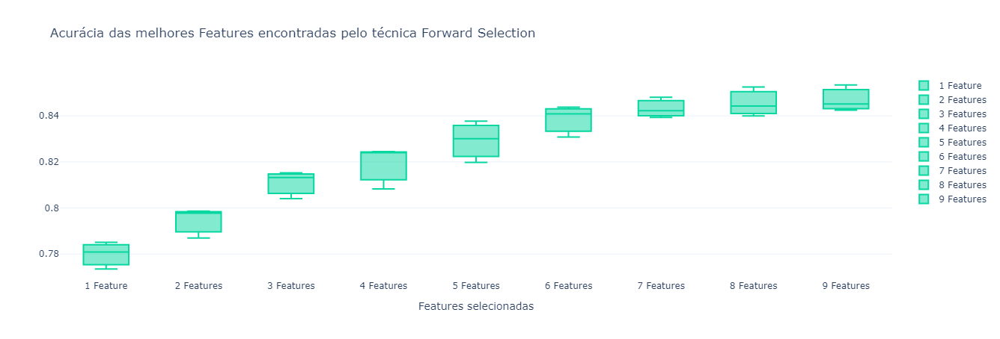

In [94]:
# Plotando os scores da acurácia, obtida pelas features selecionadas em cada fase de busca, segundo a técnica Forward Selection.

plotBoxplot (
    data   = fs,
    title  = 'Acurácia das melhores Features encontradas pelo técnica Forward Selection',
    xaxis  = 'Features selecionadas'
)

In [95]:
# Transpondo DataFrame.

fs = fs.transpose()

# Criando uma nova coluna, com os nomes das Features utilizadas, em cada avaliação no DataFrame.

fs['featuresNames'] = [', '.join(f) for f in featureNames]

# Exibindo o nome das features utilizadas em cada avaliação.

fs[['featuresNames']]

,featuresNames
1 Feature,price
2 Features,"neighbourhood, price"
3 Features,"neighbourhood, price, calculated_host_listings..."
4 Features,"neighbourhood, price, calculated_host_listings..."
5 Features,"neighbourhood, price, reviews_per_month, calcu..."
6 Features,"neighbourhood, price, minimum_nights, reviews_..."
7 Features,"neighbourhood, longitude, price, minimum_night..."
8 Features,"neighbourhood, latitude, longitude, price, min..."
9 Features,"neighbourhood, latitude, longitude, price, min..."


O uso das **9 variáveis** selecionadas gera os menores scores para a métrica **Log Loss**.

#### **5.4.5 Extra Trees Classifier**

O **Extremely Randomized Trees Classifier (Extra Trees Classifier)** é um tipo de técnica de aprendizagem de conjunto que agrega os resultados de várias árvores de decisão descorrelacionadas coletadas em uma “floresta” para produzir seu resultado de classificação. Em conceito, é muito semelhante a um **Classificador Random Forest** e só difere na forma de construção das árvores de decisão na floresta.

Cada árvore de decisão na floresta de árvores extras é construída a partir da amostra de treinamento original. Então, em cada nó de teste, cada árvore é fornecida com uma amostra aleatória de k recursos do conjunto de recursos a partir do qual cada árvore de decisão deve selecionar o melhor recurso para dividir os dados com base em alguns critérios matemáticos (normalmente o *índice de Gini*). Essa amostra aleatória de recursos leva à criação de várias árvores de decisão não correlacionadas.

Para realizar a seleção de características usando a estrutura de floresta acima, durante a construção da floresta, para cada característica, a redução total normalizada nos critérios matemáticos usados ​​na decisão da característica de divisão (**Índice de Gini** se o *Índice de Gini* for usado na construção de floresta) é computado. Esse valor é chamado de **Importância Gini** do recurso. Para realizar a seleção de recursos, cada recurso é ordenado em ordem decrescente de acordo com a Importância Gini de cada recurso e o usuário seleciona os **k** principais recursos de acordo com sua escolha.

In [96]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe ExtraTreesClassifier.

modelETC = ExtraTreesClassifier()

# Computando os scores de cada feature.

modelETC.fit (
    X = tFeatures, 
    y = trainTarget
)

# Inserindo Scores obtidos em uma Série Temporal.

featuresImpETC = pd.Series(data = modelETC.feature_importances_, index = tFeatures.columns)

# Ordeando o nome das variáveis preditoras segundo seu score em ordem decrescente.

bfEtc = featuresImpETC.sort_values(ascending = False)

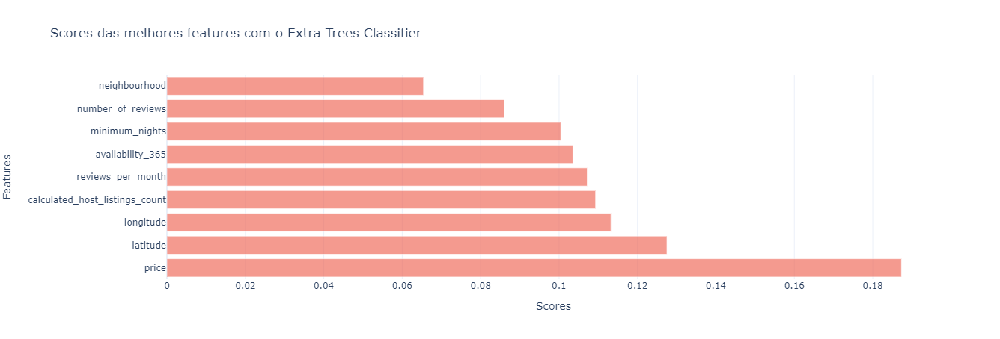

In [97]:
# Plotando um gráfico de barras, dos scores gerados para as features, a partir da técnica utilizada.

plotBar (
    data        = bfEtc, 
    title       = 'Scores das melhores features com o Extra Trees Classifier', 
    yaxis       = 'Features', 
    xaxis       = 'Scores', 
    orientation = 'h'
)

Segundo o método **Extra Trees Classifier**, as variáveis **price**, **latitude** e **longitude** são as mais importantes.

In [98]:
# Capturando o nome das variáveis preditoras.

bfEtc = bfEtc.index

# Exibindo o nome das variáveis preditoras.

bfEtc

Index(['price', 'latitude', 'longitude', 'calculated_host_listings_count',
       'reviews_per_month', 'availability_365', 'minimum_nights',
       'number_of_reviews', 'neighbourhood'],
      dtype='object')

#### **5.4.6 Random Forest Importance**


O **Random Forest**, é um dos algoritmos de aprendizado de máquina mais populares. É um dos mais bem-sucedidos porque fornece, em geral, um bom desempenho preditivo, baixo *overfitting* e é de fácil interpretabilidade. 

Essa interpretabilidade é dada pela facilidade de se derivar a importância de cada variável na árvore de decisão. Em outras palavras, é fácil calcular o quanto cada variável está contribuindo para a decisão do modelo.

O *Random Forest* consiste em 4-12 centenas de árvores de decisão, cada uma delas construída sobre uma extração aleatória das observações do conjunto de dados e uma extração aleatória das características. Nem toda árvore vê todas as características ou todas as observações, e isso garante que as árvores sejam descorrelacionadas e, portanto, menos sujeitas a sobreajuste. Cada árvore também é uma sequência de perguntas sim-não com base em um único recurso ou em uma combinação de recursos. Em cada nó (isto é em cada questão), os três dividem o conjunto de dados em 2 depósitos, cada um deles hospedando observações que são mais semelhantes entre si e diferentes das do outro bloco. Portanto, a importância de cada recurso é derivada do quão "puro" cada um dos blocos é.

Para classificação, a medida de impureza é a **impureza de Gini** ou o **ganho / entropia de informação**. Para regressão, a medida de impureza é a **variância**. Portanto, ao treinar uma árvore, é possível calcular o quanto cada recurso diminui a impureza. Quanto maior for a diminuição da impureza que um recurso gerar, mais importante ele será. Em florestas aleatórias, a diminuição da impureza de cada recurso pode ser calculada em média entre as árvores para determinar a importância final da variável.

In [99]:
# Definindo qual conjunto de dados, já escalado, deve ser utilizado.

tFeatures = trainFeaturesMM

# Instanciando um objeto da classe RandomForestClassifier.

rfImp = RandomForestClassifier (
    n_estimators = 200,
    random_state = 0
)

# Treinando o classificador com o conjunto de dados de treino.

rfImp.fit(
    X = tFeatures, 
    y = trainTarget
)

# Prevendo os scores das features dos dados de treino.

pred = rfImp.predict(tFeatures)

# Convertendo os scores para um DataFrame.

featuresImpRf = pd.Series(data = rfImp.feature_importances_, index = tFeatures.columns)

# Capturando os scores de cada uma das features.

bfRf = featuresImpRf.nlargest(8)

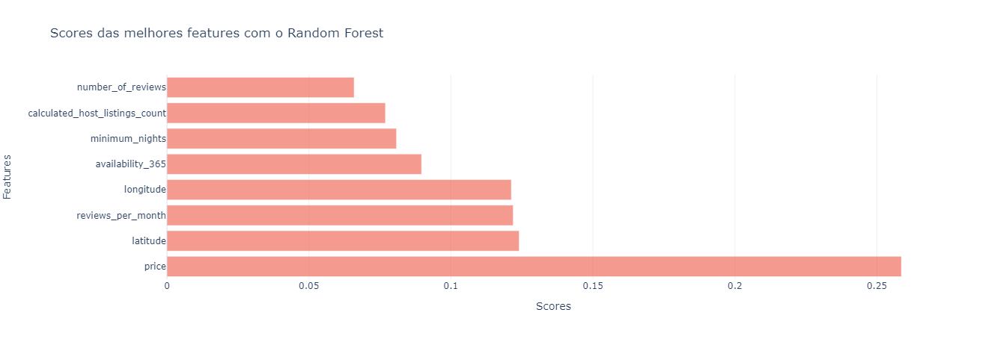

In [100]:

plotBar (
    data        = bfRf,
    title       = 'Scores das melhores features com o Random Forest', 
    yaxis       = 'Features', 
    xaxis       = 'Scores', 
    orientation = 'h'
)

Segundo o método **Random Forest**, as variáveis **price**, **latitude** e **longitude** são as mais importantes.

In [101]:
# Capturando o nome das variáveis preditoras.

bfRf = bfRf.index

# Exibindo o nome das variáveis preditoras.

bfRf

Index(['price', 'latitude', 'reviews_per_month', 'longitude',
       'availability_365', 'minimum_nights', 'calculated_host_listings_count',
       'number_of_reviews'],
      dtype='object')

#### **5.4.7 PCA**

A **Análise de componente principal (*Principal Component Analysis* - PCA)** é uma técnica de redução de dimensionalidade linear que pode ser utilizada para extrair informações de um espaço de alta dimensão projetando-as em um subespaço de dimensão inferior. Ele tenta preservar as partes essenciais que têm mais variação dos dados e remover as partes não essenciais com menos variação. As dimensões nada mais são do que recursos que representam os dados.

Uma coisa importante a se notar sobre o *PCA* é que é uma técnica de redução de dimensionalidade **não supervisionada**. Você pode agrupar os pontos de dados semelhantes com base na correlação de recursos entre eles sem qualquer supervisão (ou rótulos).

In [102]:
# Aplicando a técnica PCA, para criar 8 Componentes, a partir dos dados de treino e de teste.

trainFeaturesPCA, testFeaturesPCA =  pcaTransform(train = trainFeatures, test = testFeatures, nComponents = 5)

## **6. Modelagem Preditiva**

### **6.1 Criando funções auxiliares**

Iremos definir algumas funções, para executar as etapas de modelagem preditiva.

In [103]:
# Definindo uma função, para treinar diferentes algoritmos, e prever a variável Target de um conjunto de dados.

def classifiersTraining(features, tTarget, printMeans = True, scoring = 'accuracy'):
    
    # Definindo os valores do seed e do número de folds.
    
    num_folds = 10
    seed      = 100

    # Criando uma lista, para armazenar os modelos que serão utilizados.

    models = []

    # Criando Listas para armazenar os resultados e os nomes de cada um dos algoritmos testados.

    results = []
    names   = []

    # Criando um Dataframe para armazenar a média e o desvio-padrão de cada um dos algoritmos testados.

    means   = pd.DataFrame(columns = ['mean', 'std'])

    # Adicionando os modelos a lista.

    models.append(('LR'      , LogisticRegression()            ))
    models.append(('LDA'     , LinearDiscriminantAnalysis()    ))
    models.append(('QDA'     , QuadraticDiscriminantAnalysis() ))
    models.append(('RC'      , RidgeClassifierCV()             ))
    models.append(('NB'      , GaussianNB()                    ))
    models.append(('KNN'     , KNeighborsClassifier()          ))
    models.append(('CART'    , DecisionTreeClassifier()        ))
    models.append(('AdaBoost', AdaBoostClassifier()            ))
    models.append(('GB'      , GradientBoostingClassifier()    ))
    models.append(('SVM'     , SVC()                           ))
    models.append(('RF'      , RandomForestClassifier()        ))
    models.append(('XGBoost' , xgb.XGBClassifier()             ))

    # Avaliando cada um dos modelos da lista de modelos.

    for name, model in models:
        
        # Instanciando um objeto da classe Kfold para criar os folds.

        kfold = KFold(n_splits = num_folds, random_state = seed)
        
        # Treinando o modelo com Cross Validation.

        cv_results = cross_val_score(model, features, tTarget, cv = kfold, scoring = scoring)
        
        # Adicionando os resultados gerados na lista de resultados.

        results.append(cv_results)
        
        # Adicionando o nome do modelo avaliado na lista de nomes.

        names.append(name)

        # Adicionando a média e o desvio-padrão, dos resultados gerados pelo modelo analisado, ao Dataframe de médias.

        means = means.append (
            pd.DataFrame (
                data    = [[cv_results.mean(), cv_results.std()]], 
                columns = ['mean', 'std'], 
                index   = [name]
            )
        )

        # Imprime uma mensagem, contendo os resultados obtidos ao fim do treinamento, de cada um dos modelos.

        if printMeans:

            # Cria a mensagem a ser impressa.

            msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
            
            # Imprime a mensagem.

            print(msg)

    # Cria um DataFrame, com os resultados obtidos por cada um dos modelos avaliados.

    results = pd.DataFrame(np.transpose(results), columns = names)

    # Retorna o DataFrame, com os resultados e com as médias geradas.
    
    return (results, means)

In [106]:
# Definindo uma função para salvar um modelo preditivo já treinado.

def saveModel(name, model, fold = 'content/outputs/', ext = '.sav'):

    # Definindo o diretório e o nome do arquivo que será utilizado para salvar o modelo.

    dir = fold + name + ext

    # Salvando o modelo especificado.

    pickle.dump(model, open(dir, 'wb'))

    # Imprimindo mensagem de sucesso.

    print("Modelo salvo!")

In [107]:
# Definindo uma função para carregar um modelo preditivo já treinado.

def loadModel(name, fold = 'content/outputs/', ext = '.sav'):

    # Definindo o diretório e o nome do arquivo que será utilizado para carregar o modelo.

    dir = fold + name + ext

    # Imprimindo mensagem de sucesso.

    print("Modelo carregado!")

    # Carregando o modelo especificado.

    return pickle.load(open(dir, 'rb'))

### **6.2 Criando modelos preditivos e avaliando suas Performances**

In [108]:
# Treinando classificadores, a partir dos componentes criados pela técnica PCA.

resultsPCA = classifiersTraining (
    features = trainFeaturesPCA, 
    tTarget  = trainTarget
)

LR: 0.745075 (0.013654)
LDA: 0.745075 (0.013654)
QDA: 0.296501 (0.049099)
RC: 0.745075 (0.013654)
NB: 0.336056 (0.052405)
KNN: 0.777812 (0.011672)
CART: 0.734061 (0.011726)
AdaBoost: 0.789422 (0.014310)
GB: 0.799836 (0.009227)
SVM: 0.763953 (0.010286)
RF: 0.805903 (0.009025)
XGBoost: 0.803506 (0.007916)


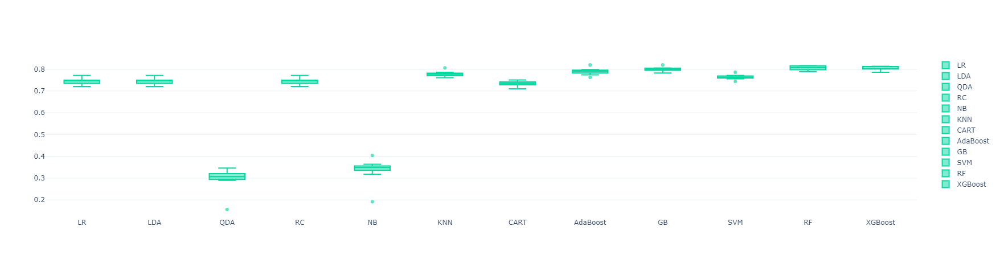

In [109]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.

plotBoxplot(data = resultsPCA[0])

O algoritmo **Random Forest**, foi o que obteve a melhor acurácia, para o conjunto de componentes do **PCA**.

In [110]:
# Treinando classificadores, a partir da escala, e da técnica de Feature Selection utilizada.

resultsMM = classifiersTraining (
    features = trainFeaturesMM, 
    tTarget  = trainTarget
)

LR: 0.747172 (0.011841)
LDA: 0.749344 (0.011306)
QDA: 0.273279 (0.039102)
RC: 0.747172 (0.012350)
NB: 0.315679 (0.049805)
KNN: 0.740355 (0.012631)
CART: 0.764101 (0.010781)
AdaBoost: 0.804330 (0.012411)
GB: 0.841336 (0.007912)
SVM: 0.749270 (0.014572)
RF: 0.846581 (0.009810)
XGBoost: 0.849352 (0.007495)


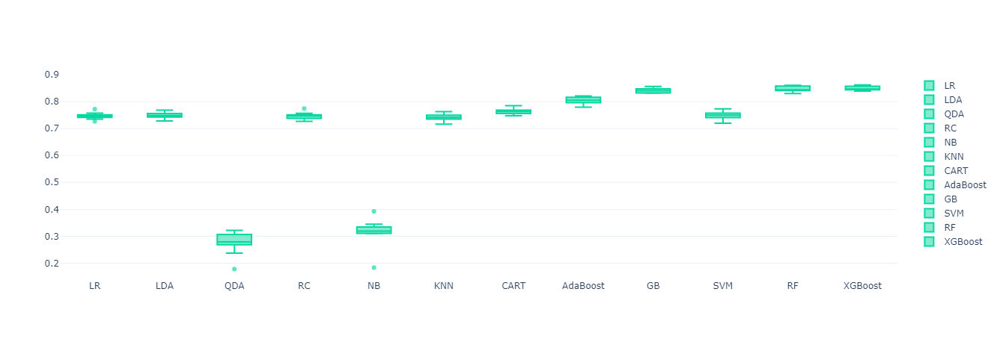

In [111]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.

plotBoxplot(data = resultsMM[0])

O algoritmo **XGBoost**, foi o que obteve a melhor acurácia, para o conjunto dados transformados pelo algoritmo *MinMaxScaler*.

In [112]:
# Treinando classificadores, a partir da escala, e da técnica de Feature Selection utilizada.

resultsSS = classifiersTraining (
    features = trainFeaturesSS, 
    tTarget  = trainTarget
)

LR: 0.760282 (0.012798)
LDA: 0.749344 (0.011306)
QDA: 0.273279 (0.039102)
RC: 0.747172 (0.012364)
NB: 0.315679 (0.049805)
KNN: 0.759682 (0.016736)
CART: 0.766723 (0.007732)
AdaBoost: 0.804330 (0.012411)
GB: 0.841262 (0.007774)
SVM: 0.761181 (0.011074)
RF: 0.846805 (0.008388)
XGBoost: 0.849427 (0.007286)


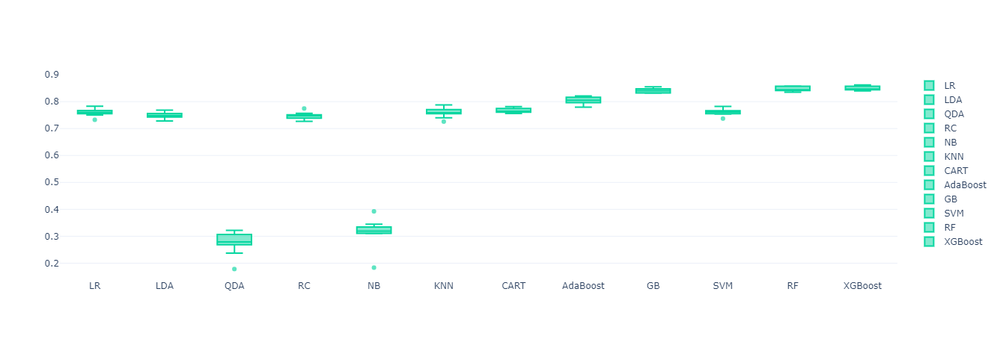

In [113]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.

plotBoxplot(data = resultsSS[0])

O algoritmo **XGBoost**, foi o que obteve a melhor acurácia, para o conjunto dados transformados pelo algoritmo *StandardScaler*.

In [114]:
# Treinando classificadores, a partir da escala, e da técnica de Feature Selection utilizada.

resultsND = classifiersTraining (
    features = trainFeaturesNormDistribuition, 
    tTarget  = trainTarget
)

LR: 0.806278 (0.007887)
LDA: 0.803356 (0.007776)
QDA: 0.790921 (0.008653)
RC: 0.797888 (0.010978)
NB: 0.785977 (0.009817)
KNN: 0.770545 (0.012647)
CART: 0.765750 (0.009761)
AdaBoost: 0.804330 (0.012411)
GB: 0.841861 (0.007145)
SVM: 0.798937 (0.011020)
RF: 0.846731 (0.010330)
XGBoost: 0.850326 (0.008395)


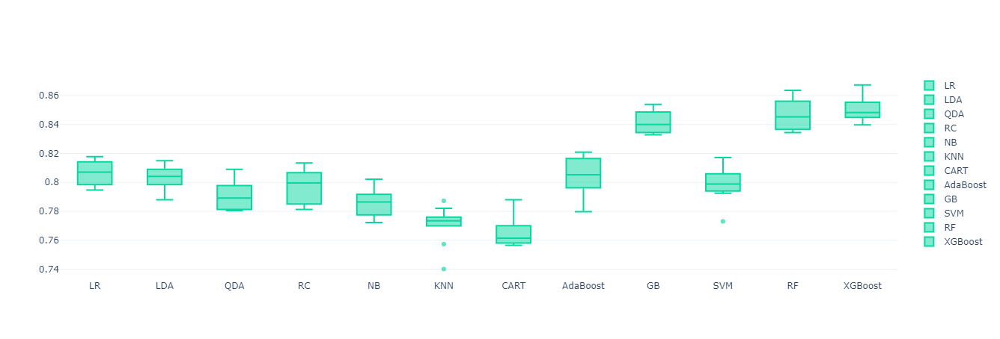

In [115]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.

plotBoxplot(data = resultsND[0])

O algoritmo **XGBoost**, foi o que obteve a melhor acurácia, para o conjunto dados transformados pelo algoritmo *Box-Cox*.

In [116]:
# Treinando classificadores, a partir da escala, e da técnica de Feature Selection utilizada.

resultsNorm = classifiersTraining (
    features = trainFeaturesNormalized, 
    tTarget  = trainTarget
)

LR: 0.745075 (0.013654)
LDA: 0.749344 (0.011306)
QDA: 0.273279 (0.039102)
RC: 0.745075 (0.013654)
NB: 0.315679 (0.049805)
KNN: 0.770170 (0.012900)
CART: 0.766874 (0.015838)
AdaBoost: 0.805979 (0.011151)
GB: 0.838190 (0.010467)
SVM: 0.759608 (0.013988)
RF: 0.845682 (0.009465)
XGBoost: 0.849352 (0.007389)


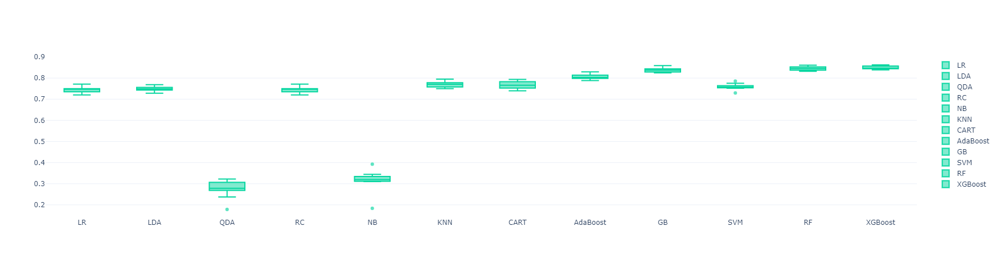

In [117]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.

plotBoxplot(data = resultsNorm[0])

O algoritmo **XGBoost**, foi o que obteve a melhor acurácia, para o conjunto dados transformados pelo algoritmo *Normalize*.

### **6.3 Realizando previsões para o conjunto de dados de teste**

#### **6.3.1 Otimizando Classificadores**

Agora que já testamos diferentes algoritmos com diversas escalas, iremos escolher os melhores modelos criados e otimizar seus parâmetros. A partir dos testes anteriores, notamos que os algoritmos baseados em **árvores de decisão** apresentaram os melhores resultados. Em parte, isso se justifica pelo *desbalanceamento* dos registros das classes da variável a ser prevista.

Para validar estas teorias, iremos criar modelos baseados nos algoritmos **Logist Regression**, **Random Forest** e **XGBoost**. A função **Log Loss** será utilizada para avaliar o custo dos modelos, isto é, previsões incorretas de maneira muito confiante terão penalidades maiores. A **acurácia** dos modelos apenas será uma métrica adicional calculada durante o treinamento. 

##### **6.3.1.1 Algoritmo Logistic Regression**

Iremos buscar pelos melhores parâmetros, para criar um modelo com o algoritmo de **Regressão Logística**.

In [118]:
# Definindo qual conjunto de dados de treino, já escalado, deve ser utilizado e a sua variável target.

trainX = trainFeaturesMM
trainY = trainTarget

# Definindo qual conjunto de dados de teste, já escalado, deve ser utilizado e a sua variável target.

testX = testFeaturesMM
testY = testTarget

# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado.

paramGrid = dict (
    penalty      = ['l1', 'l2'],
    C            = [15, 16, 17, 18, 19, 20],
    solver       = ['newton-cg', 'sag', 'saga', 'lbfgs'],
    random_state = [0],
    tol          = [0.0000010, 0.0000015, 0.0000020, 0.0000025],
    max_iter     = [25, 26, 27, 28, 29, 30]
)

# Criando uma instância da classe do modelo de Regressão Logística.

model = LogisticRegression()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo.

grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo.

grid.fit(trainX, trainY)

# Exibindo a configuração, do melhor modelo treinado.

print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 1152 candidates, totalling 11520 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 288 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 901 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 1697 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 2724 tasks      | elapsed:   36.7s
[Parallel(n_jobs=-1)]: Done 3922 tasks      | elapsed:   51.5s
[Parallel(n_jobs=-1)]: Done 5236 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 7071 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 8760 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 11064 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 11520 out of 11520 | elapsed:  2.5min finished



Melhores Parâmetros para o Modelo:

 LogisticRegression(C=20, max_iter=30, penalty='l1', random_state=0,
                   solver='saga', tol=1e-06)


In [119]:
# Criando o modelo, com a melhor configuração encontrada.

classifierLR = grid.best_estimator_

# Treinando o modelo com os dados de treino.

classifierLR.fit(X = trainX, y = trainY)

LogisticRegression(C=20, max_iter=30, penalty='l1', random_state=0,
                   solver='saga', tol=1e-06)

In [120]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.

scoreTrainLR   = accuracy_score(trainY, classifierLR.predict(trainX))
scoreTrainLRLL = log_loss(list(trainY), classifierLR.predict_proba(trainX))

# Visualizando o resultado.

print('Acurácia para os dados de treino: ' + str(scoreTrainLR))
print('Log Loss para os dados de treino: ' + str(scoreTrainLRLL))

Acurácia para os dados de treino: 0.7551127425275301
Log Loss para os dados de treino: 0.600964012276689


In [121]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(trainY)
index   = pd.Series(classifierLR.predict(trainX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTrainLR = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTrainLR

Actual,0,1,2,3
Predicted,,,,
0,5114,32,1627,93
2,168,0,51,4


In [122]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.

scoreTestLR   = accuracy_score(testY, classifierLR.predict(testX))
scoreTestLRLL = log_loss(list(testY), classifierLR.predict_proba(testX))

# Visualizando o resultado.

print('Acurácia para os dados de teste: ' + str(scoreTestLR))
print('Log Loss para os dados de teste: ' + str(scoreTestLRLL))

Acurácia para os dados de teste: 0.7666267225883763
Log Loss para os dados de teste: 0.5884074684101069


In [123]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(testY)
index   = pd.Series(classifierLR.predict(testX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTestLR = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTestLR

Actual,0,1,2,3
Predicted,,,,
0,367,1,104,6
2,7,0,3,0


##### **6.3.1.2 Algoritmo Random Forest**

Iremos buscar pelos melhores parâmetros, para criar um modelo com o algoritmo **Random Forest**.

In [124]:
# Definindo qual conjunto de dados de treino, já escalado, deve ser utilizado e a sua variável target.

trainX = trainFeaturesMM
trainY = trainTarget

# Definindo qual conjunto de dados de teste, já escalado, deve ser utilizado e a sua variável target.

testX = testFeaturesMM
testY = testTarget

# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado.

paramGrid = dict (
    n_estimators      = [102], 
    max_depth         = [None, 2, 3],
    criterion         = ['gini', 'entropy'],
    max_features      = ['auto', 'sqrt', 'log2'], 
    min_samples_split = [3],#3, 4],
    min_samples_leaf  = [5]
)

# Criando uma instância da classe do modelo Random Forest.

model = RandomForestClassifier()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo.

grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo.

grid.fit(trainX, trainY)        

# Exibindo a configuração, do melhor modelo treinado.

print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 18 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   14.5s finished



Melhores Parâmetros para o Modelo:

 RandomForestClassifier(criterion='entropy', min_samples_leaf=5,
                       min_samples_split=3, n_estimators=102)


In [125]:
# Criando o modelo, com a melhor configuração encontrada.

classifierRF = grid.best_estimator_

# Treinando o modelo com os dados de treino.

classifierRF.fit(X = trainX, y = trainY)

RandomForestClassifier(criterion='entropy', min_samples_leaf=5,
                       min_samples_split=3, n_estimators=102)

In [139]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.

scoreTrainRF   = accuracy_score(trainY, classifierRF.predict(trainX))
scoreTrainRFLL = log_loss(list(trainY), classifierRF.predict_proba(trainX))

# Visualizando o resultado.

print('Acurácia para os dados de treino: ' + str(scoreTrainRF))
print('Log Loss para os dados de treino: ' + str(scoreTrainRFLL))

Acurácia para os dados de treino: 0.9175968237321148
Log Loss para os dados de treino: 0.24173112649157852


In [140]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(trainY)
index   = pd.Series(classifierRF.predict(trainX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTrainRF = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTrainRF

Actual,0,1,2,3
Predicted,,,,
0,4146,27,1328,75
1,4,0,0,0
2,1093,5,340,22
3,39,0,10,0


In [141]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.

scoreTestRF = accuracy_score(testY, classifierRF.predict(testX))
scoreTestRFLL = log_loss(list(testY), classifierRF.predict_proba(testX))

# Visualizando o resultado.

print('Acurácia  para os dados de teste: ' + str(scoreTestRF))
print('Log Loss para os dados de teste: ' + str(scoreTestRFLL))

Acurácia  para os dados de teste: 0.8571000599161175
Log Loss para os dados de teste: 0.4285902862590277


In [142]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(testY)
index   = pd.Series(classifierRF.predict(testX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTestRF = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTestRF

Actual,0,1,2,3
Predicted,,,,
0,312,1,89,6
2,60,0,18,0
3,2,0,0,0


##### **6.3.1.3 Algoritmo Xgboost**

Iremos buscar pelos melhores parâmetros, para criar um modelo com algoritmo **Xgboost**.

In [175]:
# Definindo qual conjunto de dados de treino, já escalado, deve ser utilizado e a sua variável target.

trainX = trainFeaturesMM
trainY = trainTarget

# Definindo qual conjunto de dados de teste, já escalado, deve ser utilizado e a sua variável target.

testX = testFeaturesMM
testY = testTarget

# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado.

paramGrid = dict (
    missing          = [np.nan],
    booster          = ['gbtree', 'gblinear', 'dart'],
    max_depth        = [6], 
    n_estimators     = [220],
    learning_rate    = [0.02], 
    nthread          = [4],
    gamma            = [0.01],
    subsample        = [0.7],
    eval_metric      = ['mlogloss', 'merror'],
    colsample_bytree = [.9], 
    seed             = [100]
)

# Criando uma instância da classe do modelo Random Forest.

model = xgb.XGBClassifier()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo.

grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo.

grid.fit(trainX, trainY)

# Exibindo a configuração, do melhor modelo treinado.

print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 6 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.5min finished



Melhores Parâmetros para o Modelo:

 XGBClassifier(base_score=0.5, booster='dart', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, eval_metric='mlogloss',
              gamma=0.01, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.02, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=220, n_jobs=4, nthread=4,
              num_parallel_tree=1, objective='multi:softprob', random_state=100,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None, seed=100,
              subsample=0.7, tree_method='exact', validate_parameters=1,
              verbosity=None)


In [176]:
# Criando o modelo, com a melhor configuração encontrada.

classifierXGB = grid.best_estimator_

classifierXGB.fit(X = trainX, y = trainY)

XGBClassifier(base_score=0.5, booster='dart', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, eval_metric='mlogloss',
              gamma=0.01, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.02, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=220, n_jobs=4, nthread=4,
              num_parallel_tree=1, objective='multi:softprob', random_state=100,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None, seed=100,
              subsample=0.7, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [177]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.

scoreTrainXGB   = accuracy_score(trainY, classifierXGB.predict(trainX))
scoreTrainXGBLL = log_loss(list(trainY), classifierXGB.predict_proba(trainX))

# Visualizando o resultado.

print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))
print('Log Loss para os dados de treino: ' + str(scoreTrainXGBLL))

Acurácia para os dados de treino: 0.8763952355981721
Log Loss para os dados de treino: 0.33582643658666184


In [190]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(trainY)
index   = pd.Series(classifierXGB.predict(trainX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTestXGB = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTestXGB

Actual,0,1,2,3
Predicted,,,,
0,4237,29,1348,77
1,14,0,1,0
2,987,3,317,19
3,44,0,12,1


In [179]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.

scoreTestXGB = accuracy_score(testY, classifierXGB.predict(testX))
scoreTestXGBLL = log_loss(list(testY), classifierXGB.predict_proba(testX))

# Visualizando o resultado.

print('Acurácia  para os dados de teste: ' + str(scoreTestXGB)) # 0.8340217799474278
print('Log Loss para os dados de teste: ' + str(scoreTestXGBLL))

Acurácia  para os dados de teste: 0.8568004793289394
Log Loss para os dados de teste: 0.3950055475732331


In [191]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(testY)
index   = pd.Series(classifierXGB.predict(testX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

# Criando um CrossTab com os resultados gerados.

crossTabTestXGB = pd.crosstab(columns = columns, index = index)

# Exibindo a CrossTab.

crossTabTestXGB

Actual,0,1,2,3
Predicted,,,,
0,307,1,86,6
1,1,0,0,0
2,64,0,21,0
3,2,0,0,0


#### **6.3.2 Avaliando as métricas do melhor classificador para os dados de teste**

O melhor classificador treinado, utiliza o algoritmo **XGBoost** com as *features* **normalizadas**. Salvaremos as configurações desse modelo em um arquivo *.sav*. 

In [149]:
# Salvando o modelo preditivo especificado.

saveModel(name = 'classifierXGB', model = classifierXGB)

Modelo salvo!


Caso deseje pular as etapas anteriores de treinamento, execute o comando a seguir, para carregar o modelo já treinado.

In [150]:
# Carregando o modelo preditivo especificado.

classifierXGB = loadModel(name = 'classifierXGB')

Modelo carregado!


Para analisar melhor a performance do modelo, precisamos determinar os valores das probabilidades geradas nas previsões.

In [151]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.

scoreTrainXGB   = accuracy_score(trainY, classifierXGB.predict(trainX))
scoreTrainXGBLL = log_loss(list(trainY), classifierXGB.predict_proba(trainX))

# Visualizando o resultado.

print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))
print('Log Loss para os dados de treino: ' + str(scoreTrainXGBLL))

Acurácia para os dados de treino: 0.8745973481159638
Log Loss para os dados de treino: 0.3413135941300888


In [152]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.

scoreTestXGB = accuracy_score(testY, classifierXGB.predict(testX))
scoreTestXGBLL = log_loss(list(testY), classifierXGB.predict_proba(testX))

# Visualizando o resultado.

print('Acurácia  para os dados de teste: ' + str(scoreTestXGB)) 
print('Log Loss para os dados de teste: ' + str(scoreTestXGBLL))

Acurácia  para os dados de teste: 0.8550029958058718
Log Loss para os dados de teste: 0.394010554179951


In [203]:
# Definindo os labels reais e os previstos pelo modelo.

columns = pd.Series(testY)
index   = pd.Series(classifierXGB.predict(testX))

# Definindo o nome das Séries de conjuntos de dados.

columns.name = 'Actual'
index.name   = 'Predicted'

In [204]:
# Criando dicionário para renomear os valores da variável preditora.

map = {
    0: 'Entire home/apt',
    1: 'Hotel room',
    2: 'Private room',
    3: 'Shared room'
}

# Criando um dataframe com o conjunto de dados da variável preditora e o conjunto de dados previsto.

table = pd.concat(
    objs = [
        columns.reset_index().drop(['index'], axis = 1), 
        index.reset_index().drop(['index'], axis = 1)
    ], 
    axis = 1
)

# Renomeando os valores do conjunto de dados.

for c in table.columns:
    table[c] = [map[i] for i in table[c]]

# Exibindo a CrossTab.

pd.crosstab(columns = table['Actual'], index = table['Predicted'])

Actual,Entire home/apt,Hotel room,Private room,Shared room
Predicted,,,,
Entire home/apt,2403,7,317,7
Hotel room,0,5,0,0
Private room,115,3,441,28
Shared room,0,0,1,11


Finalizamos esta análise, concluindo que o algoritmo **XGBoost**, gerou o modelo com o menor score para a métrica **Log Loss**. Os scores alcançados para os conjuntos de dados foram:

* **Dados de treino**: 0.3413135941300888.
* **Dados de teste**: 0.394010554179951.

## **Entre em contato comigo!**

Caso tenha alguma dúvida, sugestão ou apenas queira trocar uma ideia sobre este projeto, não hesite em entrar em contato comigo!

<table align='center'>
    <tr style=" background-color: rgba(0,0,0,0);">
        <td>
            <img src="https://image.flaticon.com/icons/svg/732/732026.svg" alt="Email" height="42" width="42">
        </td>
        <td>
            <p>
                <a href="mailto:franklinfs390@gmail.com">E-mail</href>
            </p>
        </td>
    <td>
            <img src="https://image.flaticon.com/icons/svg/254/254394.svg" alt="Linkedin" height="42" width="42">
    </td>
    <td>
        <p>
            <a href="https://www.linkedin.com/in/franklinfs390/">Linkedin</href>
        </p>
    </td>
    <td>
        <img src="https://image.flaticon.com/icons/svg/2111/2111432.svg" alt="Github" height="42" width="42">
    </td>
    <td>
        <p>
            <a href="https://github.com/franklin390">Github</href>
        </p>
    </td>
    <td>
        <img src="https://image.flaticon.com/icons/svg/1667/1667233.svg" alt="Site" height="42" width="42">
    </td>
    <td>
        <p>
            <a href="https://franklin390.github.io/">Site</href>
        </p>
    </td>
  </tr>
</table>
